# Simple GAN (for MNIST)

From first assignment of Coursera Course (Course 1 / Week 1)

## Initialization


In [ ]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST # Training dataset
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0) # Set for testing purposes, please do not change!

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in a uniform grid.
    '''
    image_unflat = image_tensor.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

## MNIST dataset

In [ ]:
!unzip MNIST.zip

## Generator


In [ ]:
def get_noise(n_samples, z_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, z_dim),
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
        n_samples: the number of samples to generate, a scalar
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    '''
    noise = torch.randn(n_samples,z_dim).to(device) 
    return noise

def get_generator_block(input_dim, output_dim):
    '''
    Function for returning a block of the generator's neural network
    given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a generator neural network layer, with a linear transformation 
          followed by a batch normalization and then a relu activation
    '''
    return nn.Sequential(
        nn.Linear(input_dim, output_dim),
        nn.BatchNorm1d(output_dim),
        nn.ReLU(inplace=True),
    )


class Generator(nn.Module):
    '''
    Generator Class
    Values:
        z_dim: the dimension of the noise vector, a scalar
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
          (MNIST images are 28 x 28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, z_dim=10, im_dim=784, hidden_dim=128):
        super(Generator, self).__init__()
        self.gen = nn.Sequential(
            get_generator_block(z_dim, hidden_dim),
            get_generator_block(hidden_dim, hidden_dim * 2),
            get_generator_block(hidden_dim * 2, hidden_dim * 4),
            get_generator_block(hidden_dim * 4, hidden_dim * 8),
            nn.Linear(hidden_dim * 8, im_dim),
            nn.Sigmoid()
        )
    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor, 
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
        return self.gen(noise)
    

## Discriminator

In [ ]:
def get_discriminator_block(input_dim, output_dim):
    '''
    Discriminator Block
    Function for returning a neural network of the discriminator given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a discriminator neural network layer, with a linear transformation 
          followed by an nn.LeakyReLU activation with negative slope of 0.2 
          (https://pytorch.org/docs/master/generated/torch.nn.LeakyReLU.html)
    '''
    return nn.Sequential(
        nn.Linear(input_dim, output_dim),
        nn.LeakyReLU(0.2)
    )

class Discriminator(nn.Module):
    '''
    Discriminator Class
    Values:
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
            (MNIST images are 28x28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_dim=784, hidden_dim=128):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            get_discriminator_block(im_dim, hidden_dim * 4),
            get_discriminator_block(hidden_dim * 4, hidden_dim * 2),
            get_discriminator_block(hidden_dim * 2, hidden_dim),
            nn.Linear(hidden_dim,1)
        )

    def forward(self, image):
        '''
        Function for completing a forward pass of the discriminator: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_dim)
        '''
        return self.disc(image)
    

## Training

In [ ]:
# Set your parameters
criterion = nn.BCEWithLogitsLoss()
n_epochs = 200
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.00001
#device = 'cuda'
device = 'cpu'
# Load MNIST dataset as tensors
dataloader = DataLoader(
    MNIST('.', download=False, transform=transforms.ToTensor()),
    batch_size=batch_size,
    shuffle=True)

In [ ]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().to(device) 
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

In [ ]:
def get_disc_loss(gen, disc, criterion, real, num_images, z_dim, device):
    '''
    Return the loss of the discriminator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        real: a batch of real images
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        disc_loss: a torch scalar loss value for the current batch
    '''
    
    noise       = get_noise(num_images, z_dim, device)  
    fake_images = gen(noise)
    
    fake_pred   = disc(fake_images.detach())
    fake_true   = torch.zeros_like(fake_pred)
    fake_loss   = criterion(fake_pred,fake_true)
    
    real_pred   = disc(real)
    real_true   = torch.ones_like(real_pred)
    real_loss   = criterion(real_pred,real_true)
    
    disc_loss   = (fake_loss+real_loss)/2

    #### END CODE HERE ####
    return disc_loss

In [ ]:
def get_gen_loss(gen, disc, criterion, num_images, z_dim, device):

    '''
    Return the loss of the generator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        gen_loss: a torch scalar loss value for the current batch
    '''
    
    noise       = get_noise(num_images, z_dim, device)  
    fake_images = gen(noise)

    fake_pred   = disc(fake_images)

    fake_true   = torch.ones_like(fake_pred)
    gen_loss    = criterion(fake_pred,fake_true)
    
    return gen_loss

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 500: Generator loss: 1.3898792718648914, discriminator loss: 0.4195079874396327


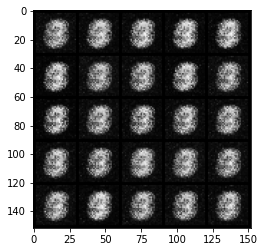

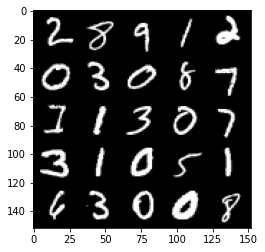

  0%|          | 0/469 [00:00<?, ?it/s]

Step 1000: Generator loss: 1.6752357010841374, discriminator loss: 0.29896934673190123


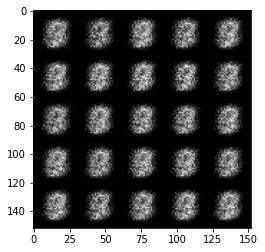

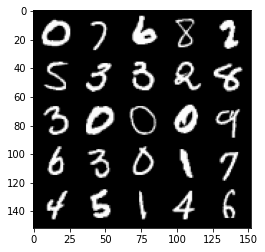

  0%|          | 0/469 [00:00<?, ?it/s]

Step 1500: Generator loss: 1.9660416698455818, discriminator loss: 0.17325548082590117


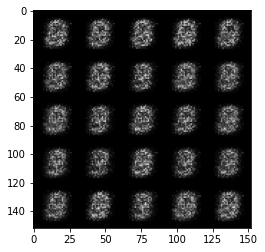

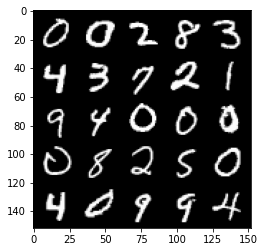

  0%|          | 0/469 [00:00<?, ?it/s]

Step 2000: Generator loss: 1.7945200018882754, discriminator loss: 0.19041523796319956


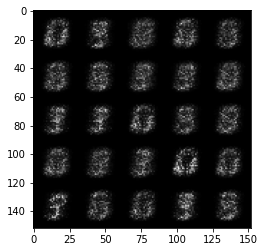

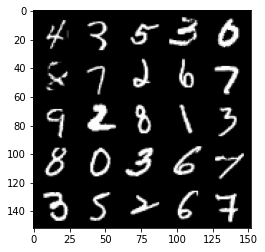

  0%|          | 0/469 [00:00<?, ?it/s]

Step 2500: Generator loss: 1.7321850893497475, discriminator loss: 0.19492988628149044


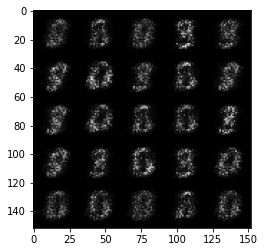

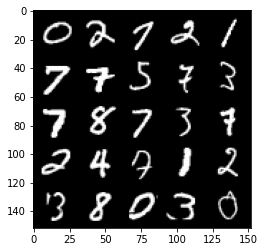

  0%|          | 0/469 [00:00<?, ?it/s]

Step 3000: Generator loss: 2.033148459911347, discriminator loss: 0.14602759775519386


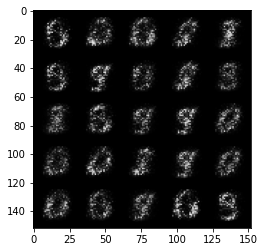

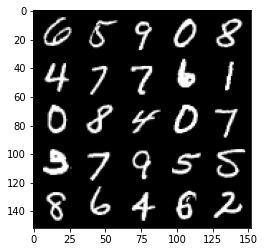

  0%|          | 0/469 [00:00<?, ?it/s]

Step 3500: Generator loss: 2.4555183939933762, discriminator loss: 0.12214172476530072


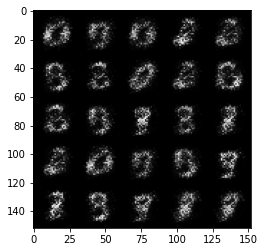

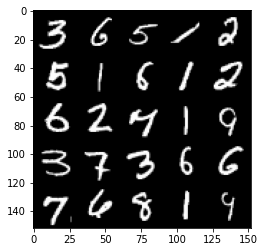

  0%|          | 0/469 [00:00<?, ?it/s]

Step 4000: Generator loss: 2.7334406495094323, discriminator loss: 0.11413051068782801


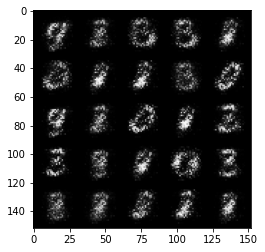

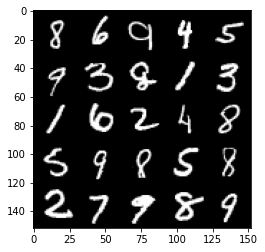

  0%|          | 0/469 [00:00<?, ?it/s]

Step 4500: Generator loss: 3.176015339374542, discriminator loss: 0.10749180458486081


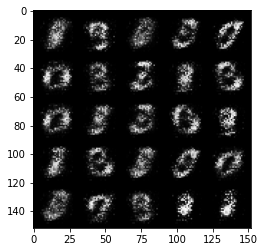

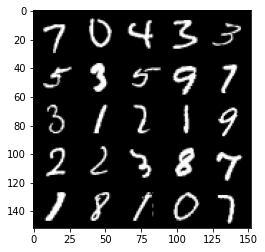

  0%|          | 0/469 [00:00<?, ?it/s]

Step 5000: Generator loss: 3.241048037052155, discriminator loss: 0.08974183657020329


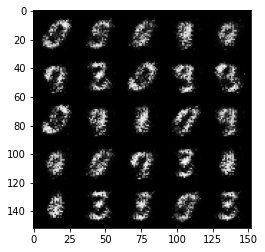

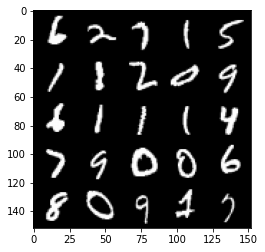

  0%|          | 0/469 [00:00<?, ?it/s]

Step 5500: Generator loss: 3.5646303114891054, discriminator loss: 0.0795595861673355


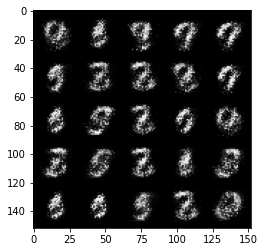

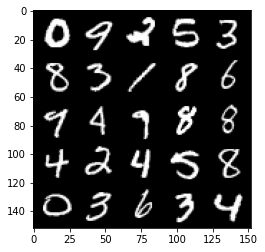

  0%|          | 0/469 [00:00<?, ?it/s]

Step 6000: Generator loss: 3.6087116527557366, discriminator loss: 0.08372086451202633


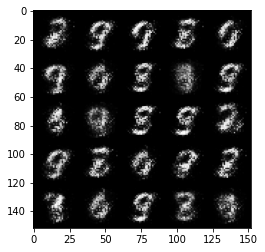

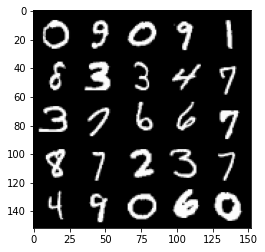

  0%|          | 0/469 [00:00<?, ?it/s]

Step 6500: Generator loss: 3.774114455223085, discriminator loss: 0.06782818335294723


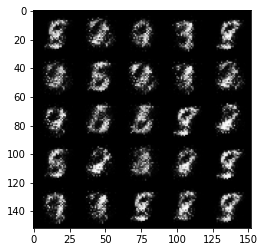

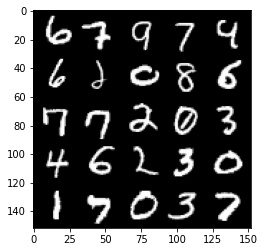

  0%|          | 0/469 [00:00<?, ?it/s]

Step 7000: Generator loss: 3.8973230848312364, discriminator loss: 0.061918504085391735


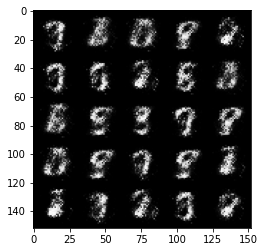

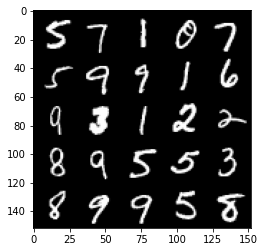

  0%|          | 0/469 [00:00<?, ?it/s]

Step 7500: Generator loss: 4.099964350700376, discriminator loss: 0.05807828714698549


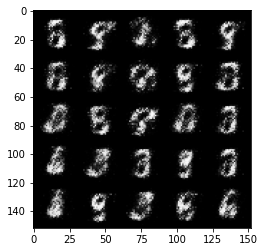

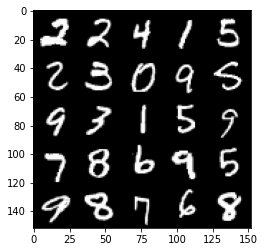

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 8000: Generator loss: 3.907996907711028, discriminator loss: 0.06305511114746337


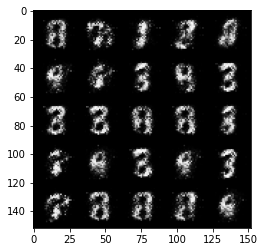

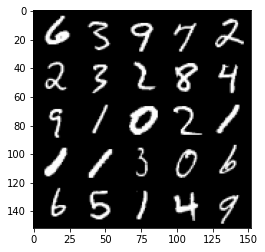

  0%|          | 0/469 [00:00<?, ?it/s]

Step 8500: Generator loss: 3.7771553211212168, discriminator loss: 0.08062627692893143


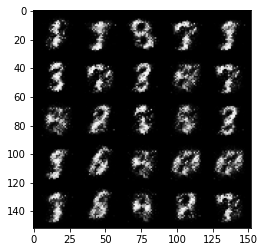

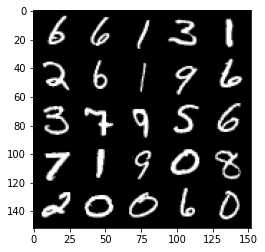

  0%|          | 0/469 [00:00<?, ?it/s]

Step 9000: Generator loss: 4.10653830385208, discriminator loss: 0.06188239745795733


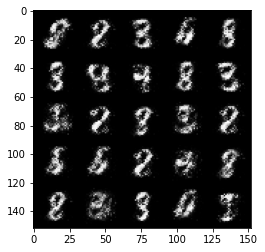

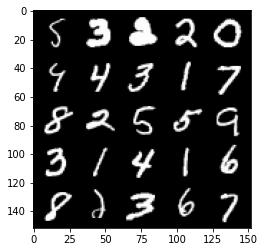

  0%|          | 0/469 [00:00<?, ?it/s]

Step 9500: Generator loss: 4.063421956539155, discriminator loss: 0.06210544347018


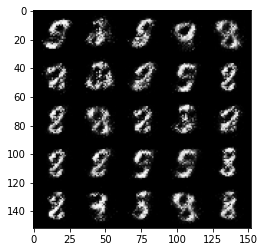

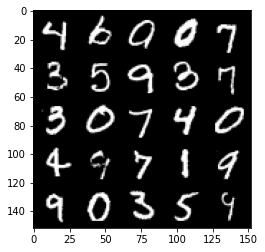

  0%|          | 0/469 [00:00<?, ?it/s]

Step 10000: Generator loss: 4.005614856719968, discriminator loss: 0.06015763641148804


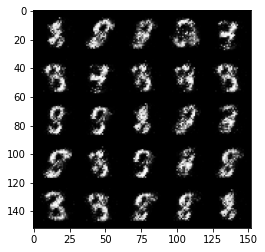

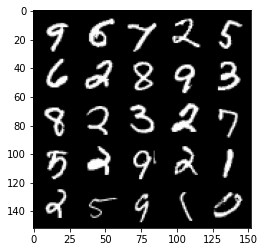

  0%|          | 0/469 [00:00<?, ?it/s]

Step 10500: Generator loss: 4.115593403816229, discriminator loss: 0.06500185120105743


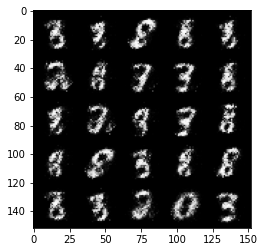

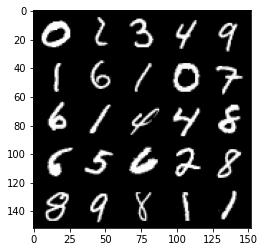

  0%|          | 0/469 [00:00<?, ?it/s]

Step 11000: Generator loss: 4.006078630924228, discriminator loss: 0.07358852632343767


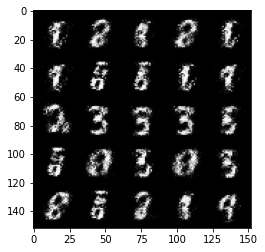

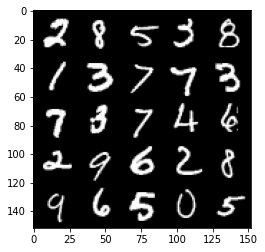

  0%|          | 0/469 [00:00<?, ?it/s]

Step 11500: Generator loss: 3.9476720809936503, discriminator loss: 0.07798371819406742


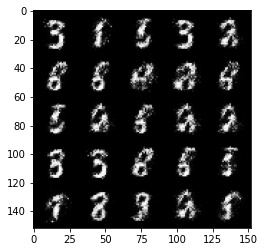

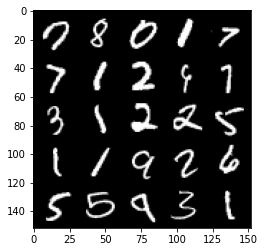

  0%|          | 0/469 [00:00<?, ?it/s]

Step 12000: Generator loss: 3.9434567227363617, discriminator loss: 0.07472205401957024


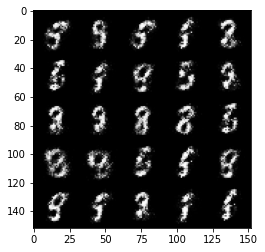

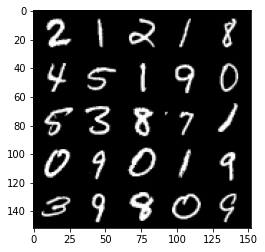

  0%|          | 0/469 [00:00<?, ?it/s]

Step 12500: Generator loss: 3.734164596557614, discriminator loss: 0.07724813582003123


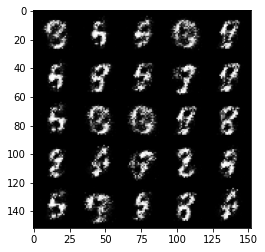

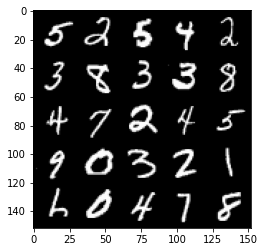

  0%|          | 0/469 [00:00<?, ?it/s]

Step 13000: Generator loss: 3.8735255818367023, discriminator loss: 0.07149955844879151


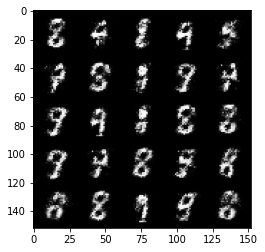

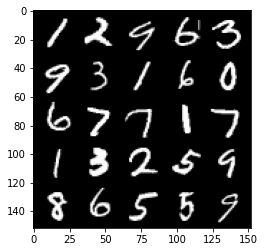

  0%|          | 0/469 [00:00<?, ?it/s]

Step 13500: Generator loss: 3.710012662887574, discriminator loss: 0.08439065374433989


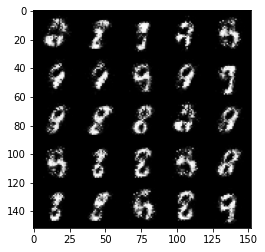

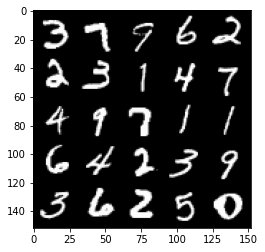

  0%|          | 0/469 [00:00<?, ?it/s]

Step 14000: Generator loss: 3.8070776877403274, discriminator loss: 0.0852751769721507


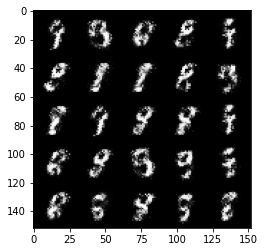

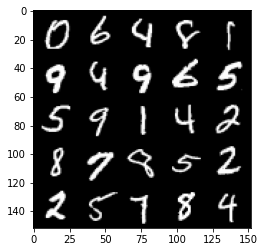

  0%|          | 0/469 [00:00<?, ?it/s]

Step 14500: Generator loss: 3.757703208446501, discriminator loss: 0.0881170902848244


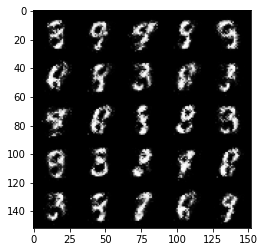

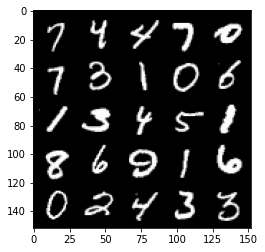

  0%|          | 0/469 [00:00<?, ?it/s]

Step 15000: Generator loss: 3.978457988739017, discriminator loss: 0.08966825775802131


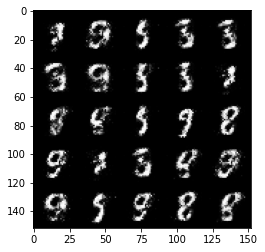

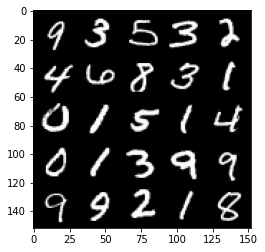

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 15500: Generator loss: 3.6569470701217655, discriminator loss: 0.10450805965811014


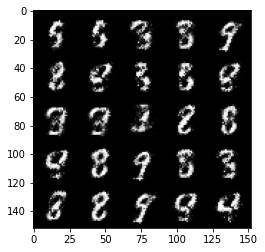

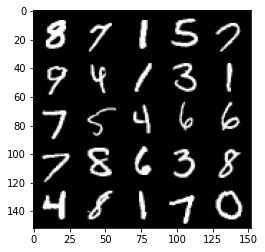

  0%|          | 0/469 [00:00<?, ?it/s]

Step 16000: Generator loss: 3.396092566490172, discriminator loss: 0.12061650808155537


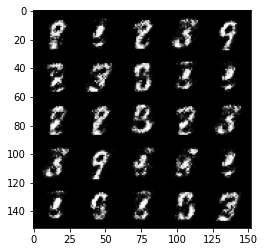

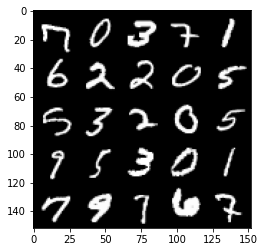

  0%|          | 0/469 [00:00<?, ?it/s]

Step 16500: Generator loss: 3.6068907175064076, discriminator loss: 0.1157617559656502


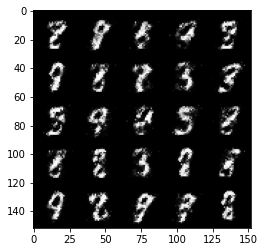

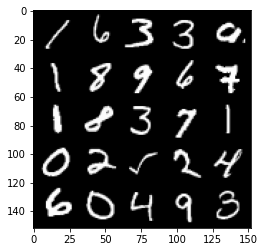

  0%|          | 0/469 [00:00<?, ?it/s]

Step 17000: Generator loss: 3.7410518126487746, discriminator loss: 0.12443360007554301


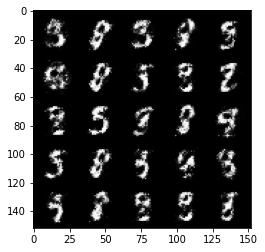

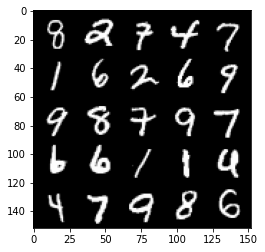

  0%|          | 0/469 [00:00<?, ?it/s]

Step 17500: Generator loss: 3.6402114658355758, discriminator loss: 0.1271024216413499


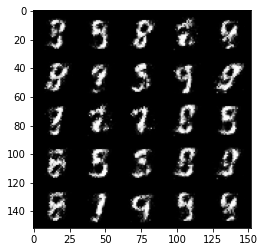

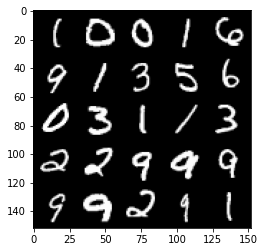

  0%|          | 0/469 [00:00<?, ?it/s]

Step 18000: Generator loss: 3.4299185481071506, discriminator loss: 0.12975439341366282


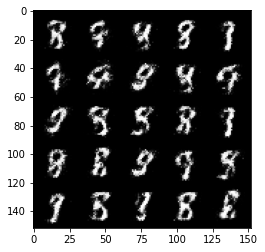

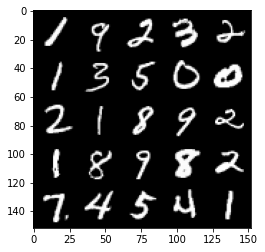

  0%|          | 0/469 [00:00<?, ?it/s]

Step 18500: Generator loss: 3.3926153993606554, discriminator loss: 0.13468568079173562


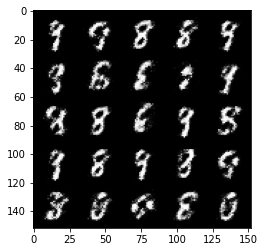

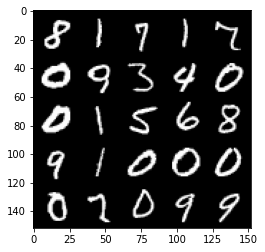

  0%|          | 0/469 [00:00<?, ?it/s]

Step 19000: Generator loss: 3.347284262657165, discriminator loss: 0.15079878689348714


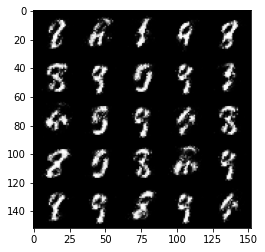

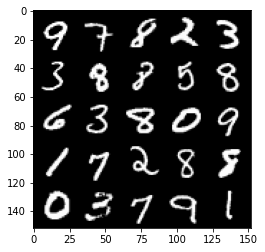

  0%|          | 0/469 [00:00<?, ?it/s]

Step 19500: Generator loss: 3.2281362862587004, discriminator loss: 0.15531207372248165


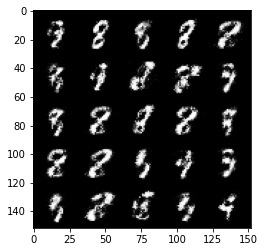

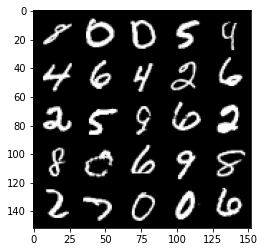

  0%|          | 0/469 [00:00<?, ?it/s]

Step 20000: Generator loss: 3.1264076542854267, discriminator loss: 0.17536287157237543


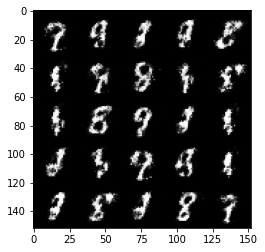

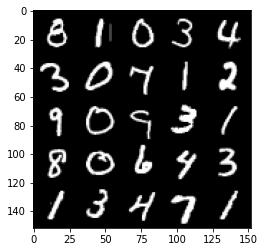

  0%|          | 0/469 [00:00<?, ?it/s]

Step 20500: Generator loss: 3.2018562850952157, discriminator loss: 0.16304027795046563


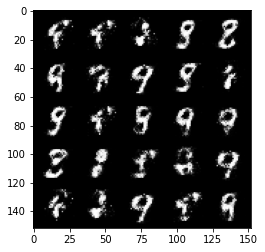

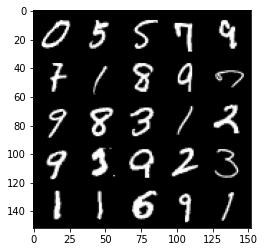

  0%|          | 0/469 [00:00<?, ?it/s]

Step 21000: Generator loss: 3.3538308568000845, discriminator loss: 0.1318580944538118


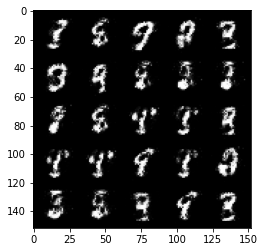

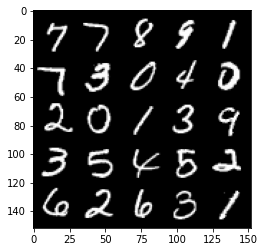

  0%|          | 0/469 [00:00<?, ?it/s]

Step 21500: Generator loss: 3.24560727310181, discriminator loss: 0.15491878156363953


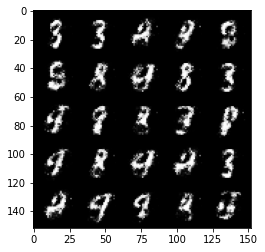

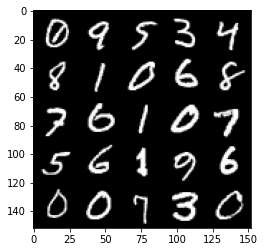

  0%|          | 0/469 [00:00<?, ?it/s]

Step 22000: Generator loss: 3.212979652404785, discriminator loss: 0.1651030905693772


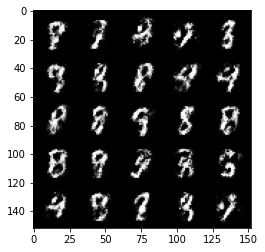

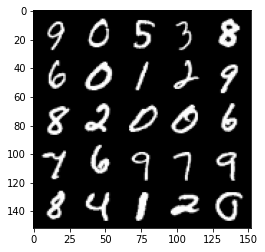

  0%|          | 0/469 [00:00<?, ?it/s]

Step 22500: Generator loss: 3.218737323284149, discriminator loss: 0.16152789111435417


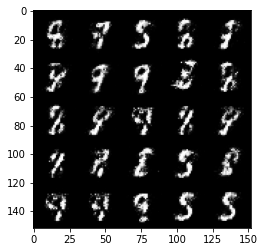

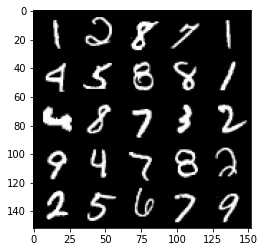

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 23000: Generator loss: 3.0973901882171644, discriminator loss: 0.17013258992135522


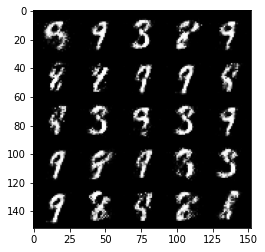

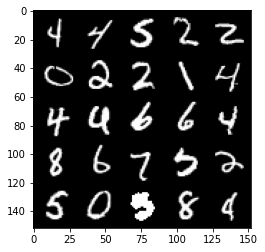

  0%|          | 0/469 [00:00<?, ?it/s]

Step 23500: Generator loss: 3.104497653007507, discriminator loss: 0.16338927154242966


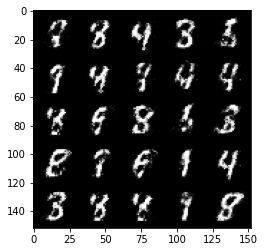

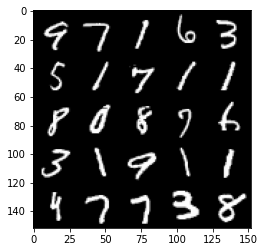

  0%|          | 0/469 [00:00<?, ?it/s]

Step 24000: Generator loss: 3.136954290390012, discriminator loss: 0.15434468923509118


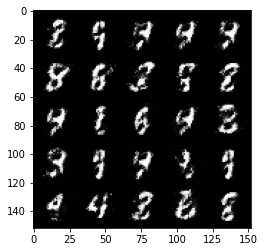

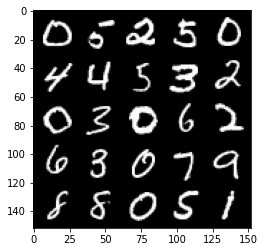

  0%|          | 0/469 [00:00<?, ?it/s]

Step 24500: Generator loss: 3.277596434116367, discriminator loss: 0.1552719298303129


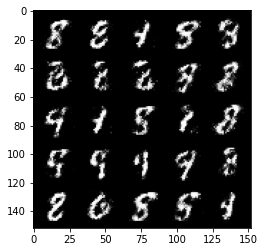

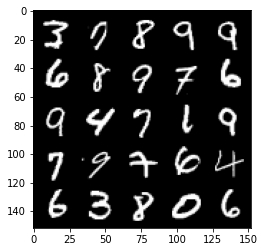

  0%|          | 0/469 [00:00<?, ?it/s]

Step 25000: Generator loss: 3.175829000949862, discriminator loss: 0.16853956495225442


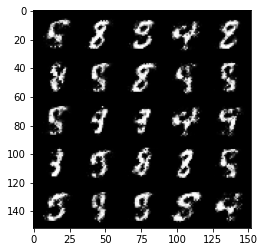

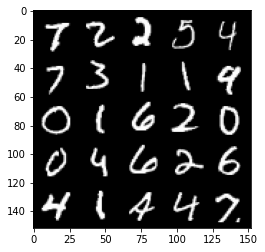

  0%|          | 0/469 [00:00<?, ?it/s]

Step 25500: Generator loss: 3.0532122049331685, discriminator loss: 0.17973085708916184


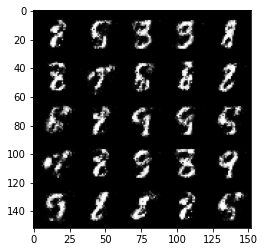

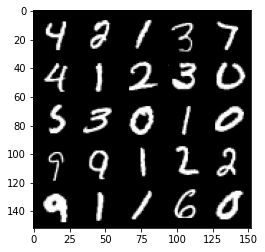

  0%|          | 0/469 [00:00<?, ?it/s]

Step 26000: Generator loss: 3.09081648159027, discriminator loss: 0.1725818346142768


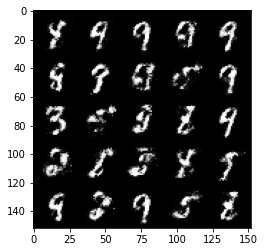

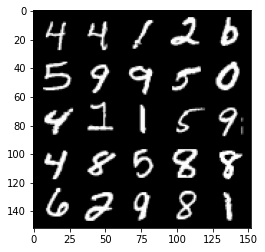

  0%|          | 0/469 [00:00<?, ?it/s]

Step 26500: Generator loss: 3.0508015069961543, discriminator loss: 0.18437762083113204


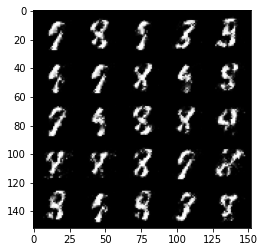

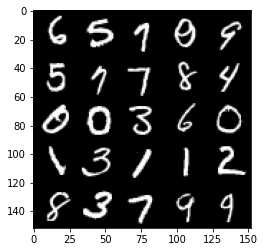

  0%|          | 0/469 [00:00<?, ?it/s]

Step 27000: Generator loss: 2.960151889801027, discriminator loss: 0.187608021378517


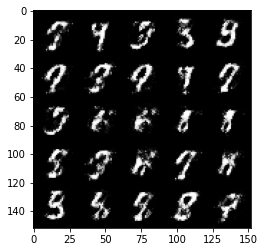

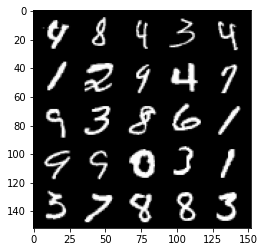

  0%|          | 0/469 [00:00<?, ?it/s]

Step 27500: Generator loss: 3.0447489571571302, discriminator loss: 0.18786293511092644


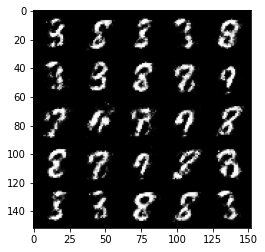

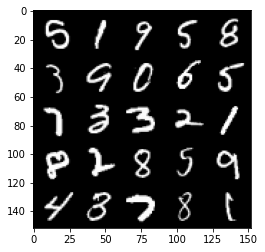

  0%|          | 0/469 [00:00<?, ?it/s]

Step 28000: Generator loss: 3.02186680841446, discriminator loss: 0.16787414668500428


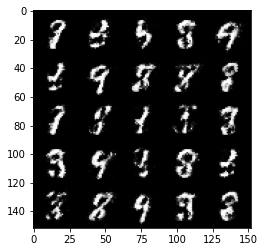

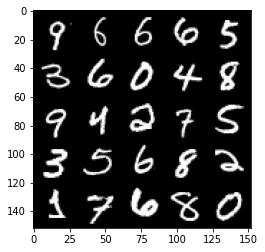

  0%|          | 0/469 [00:00<?, ?it/s]

Step 28500: Generator loss: 2.9026918625831617, discriminator loss: 0.20852125985920428


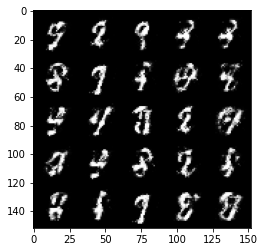

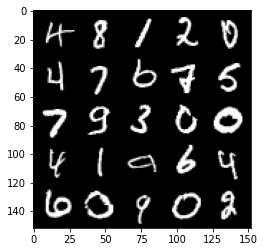

  0%|          | 0/469 [00:00<?, ?it/s]

Step 29000: Generator loss: 2.8695053186416644, discriminator loss: 0.20443006902933117


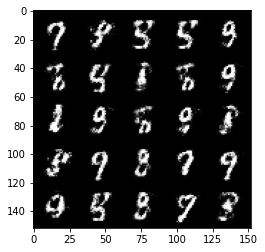

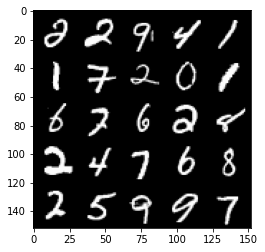

  0%|          | 0/469 [00:00<?, ?it/s]

Step 29500: Generator loss: 2.938284968852996, discriminator loss: 0.17983509020507327


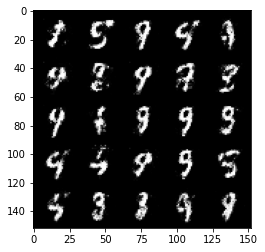

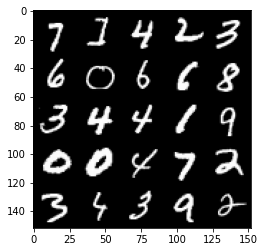

  0%|          | 0/469 [00:00<?, ?it/s]

Step 30000: Generator loss: 2.9224057350158694, discriminator loss: 0.19004020307958122


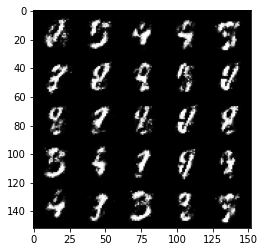

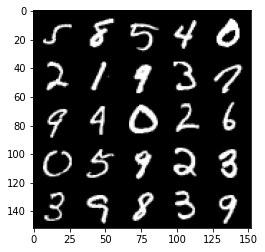

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 30500: Generator loss: 2.784781809329986, discriminator loss: 0.21302908885479016


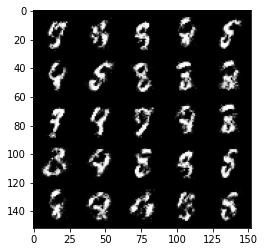

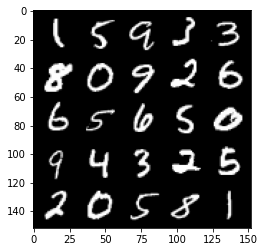

  0%|          | 0/469 [00:00<?, ?it/s]

Step 31000: Generator loss: 2.750839729785917, discriminator loss: 0.19189462843537325


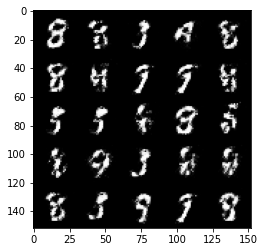

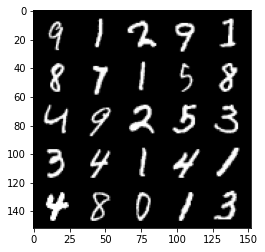

  0%|          | 0/469 [00:00<?, ?it/s]

Step 31500: Generator loss: 2.790003814220426, discriminator loss: 0.21054807052016247


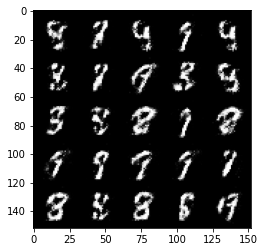

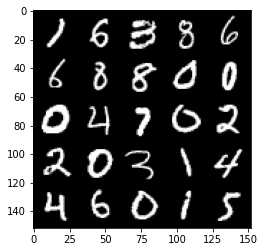

  0%|          | 0/469 [00:00<?, ?it/s]

Step 32000: Generator loss: 2.800072288036343, discriminator loss: 0.20845084710419182


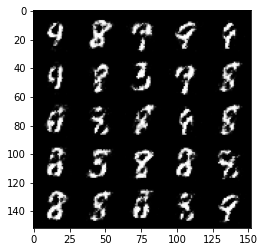

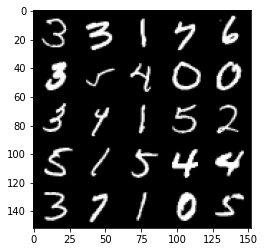

  0%|          | 0/469 [00:00<?, ?it/s]

Step 32500: Generator loss: 2.8509573931694017, discriminator loss: 0.21366971501708018


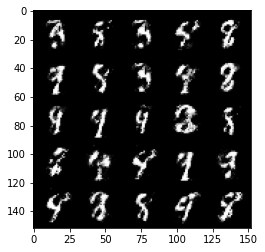

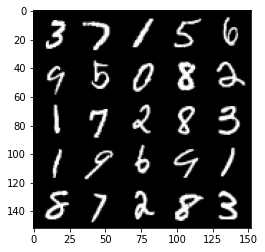

  0%|          | 0/469 [00:00<?, ?it/s]

Step 33000: Generator loss: 2.7933066730499245, discriminator loss: 0.23116985164582723


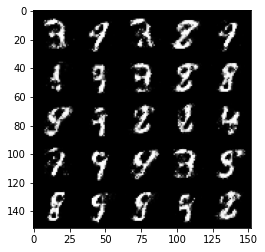

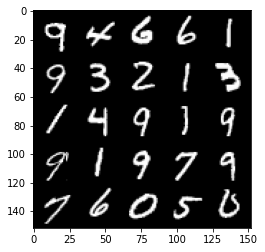

  0%|          | 0/469 [00:00<?, ?it/s]

Step 33500: Generator loss: 2.6810399923324604, discriminator loss: 0.2307566959857939


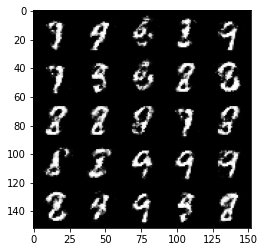

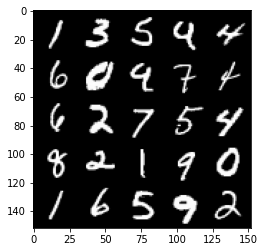

  0%|          | 0/469 [00:00<?, ?it/s]

Step 34000: Generator loss: 2.7144743170738237, discriminator loss: 0.22828044903278358


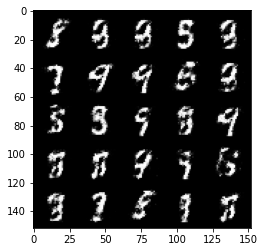

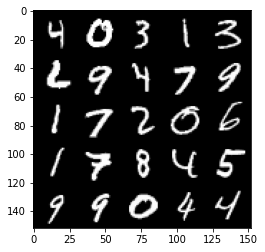

  0%|          | 0/469 [00:00<?, ?it/s]

Step 34500: Generator loss: 2.659427216053006, discriminator loss: 0.22737812927365286


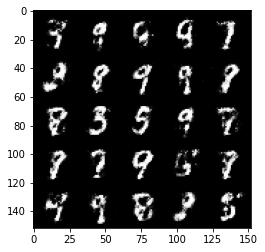

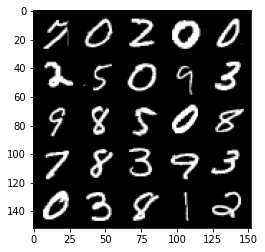

  0%|          | 0/469 [00:00<?, ?it/s]

Step 35000: Generator loss: 2.638281410217288, discriminator loss: 0.2347896790802477


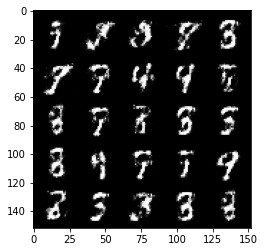

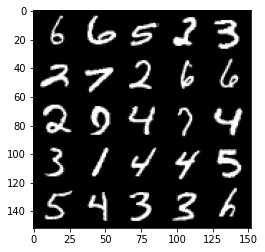

  0%|          | 0/469 [00:00<?, ?it/s]

Step 35500: Generator loss: 2.532516411781311, discriminator loss: 0.2485922982096674


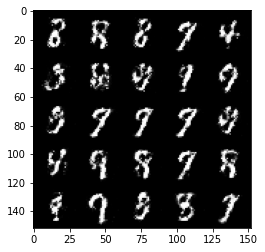

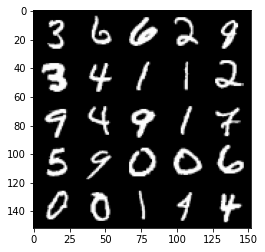

  0%|          | 0/469 [00:00<?, ?it/s]

Step 36000: Generator loss: 2.603991758823396, discriminator loss: 0.22487697613239288


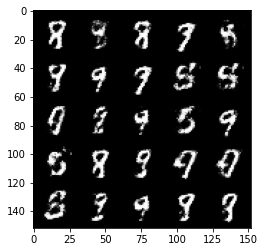

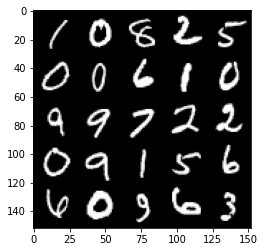

  0%|          | 0/469 [00:00<?, ?it/s]

Step 36500: Generator loss: 2.4009702968597395, discriminator loss: 0.2667425647079942


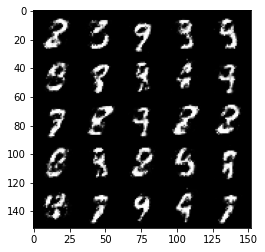

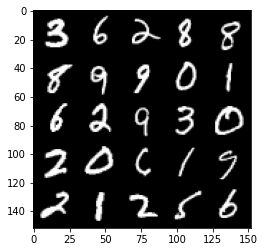

  0%|          | 0/469 [00:00<?, ?it/s]

Step 37000: Generator loss: 2.427370420217513, discriminator loss: 0.2534728107154368


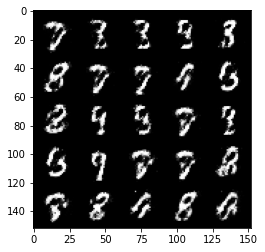

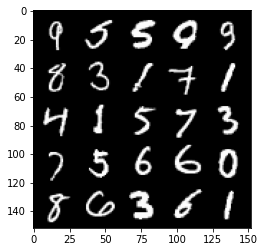

  0%|          | 0/469 [00:00<?, ?it/s]

Step 37500: Generator loss: 2.596353740692137, discriminator loss: 0.2272488026022909


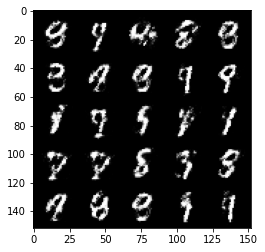

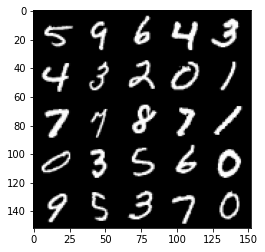

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 38000: Generator loss: 2.479287738561631, discriminator loss: 0.26595848560333235


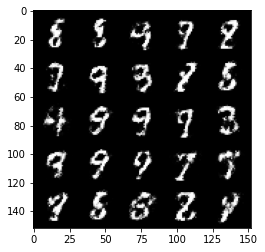

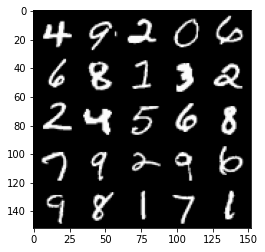

  0%|          | 0/469 [00:00<?, ?it/s]

Step 38500: Generator loss: 2.3498818070888507, discriminator loss: 0.2703905988335611


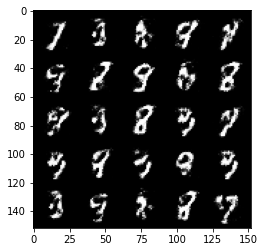

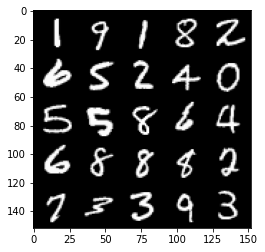

  0%|          | 0/469 [00:00<?, ?it/s]

Step 39000: Generator loss: 2.3782564852237686, discriminator loss: 0.2558600442111495


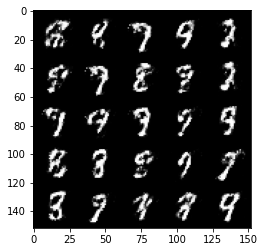

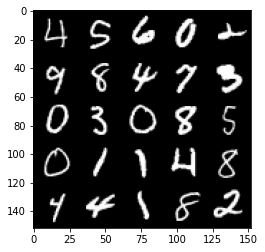

  0%|          | 0/469 [00:00<?, ?it/s]

Step 39500: Generator loss: 2.256987802982332, discriminator loss: 0.2899231518208978


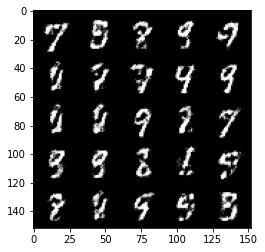

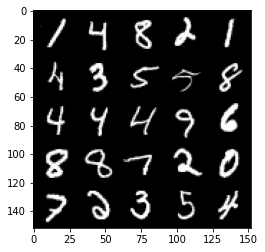

  0%|          | 0/469 [00:00<?, ?it/s]

Step 40000: Generator loss: 2.2716605246067036, discriminator loss: 0.2895797375738622


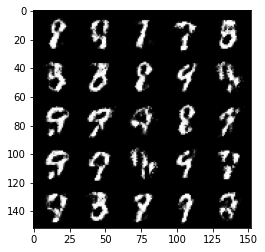

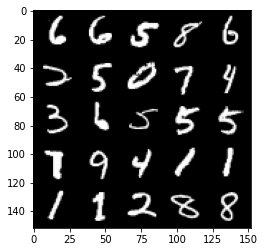

  0%|          | 0/469 [00:00<?, ?it/s]

Step 40500: Generator loss: 2.233510307312012, discriminator loss: 0.2796865975260732


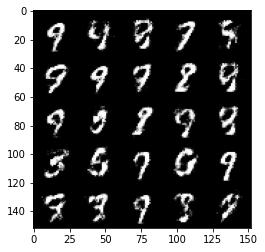

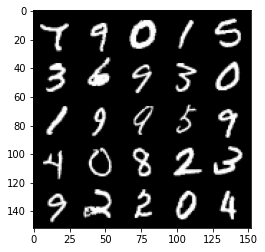

  0%|          | 0/469 [00:00<?, ?it/s]

Step 41000: Generator loss: 2.194591218709947, discriminator loss: 0.2906728111207489


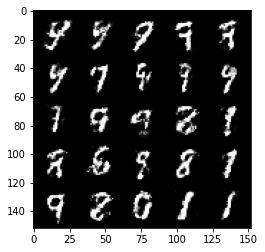

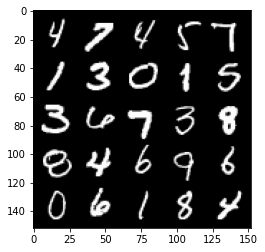

  0%|          | 0/469 [00:00<?, ?it/s]

Step 41500: Generator loss: 2.1535320312976816, discriminator loss: 0.2973009089827538


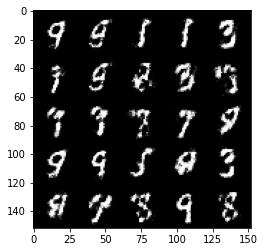

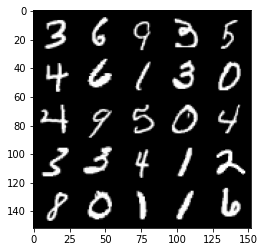

  0%|          | 0/469 [00:00<?, ?it/s]

Step 42000: Generator loss: 2.2101156399250055, discriminator loss: 0.2840559582412244


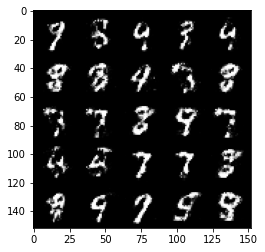

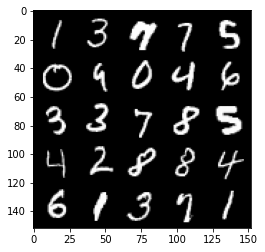

  0%|          | 0/469 [00:00<?, ?it/s]

Step 42500: Generator loss: 2.0807216982841488, discriminator loss: 0.314984311312437


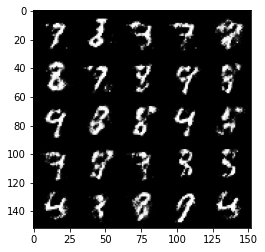

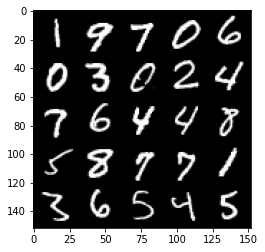

  0%|          | 0/469 [00:00<?, ?it/s]

Step 43000: Generator loss: 2.1999671480655687, discriminator loss: 0.2900167551636698


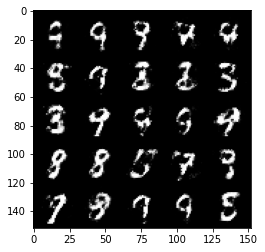

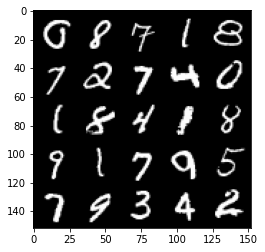

  0%|          | 0/469 [00:00<?, ?it/s]

Step 43500: Generator loss: 2.1469185218811044, discriminator loss: 0.2958547198474408


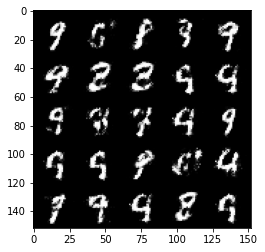

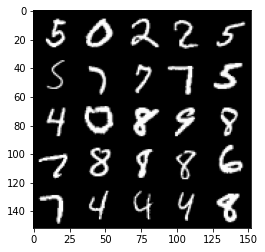

  0%|          | 0/469 [00:00<?, ?it/s]

Step 44000: Generator loss: 2.2264398715496054, discriminator loss: 0.28562087288498916


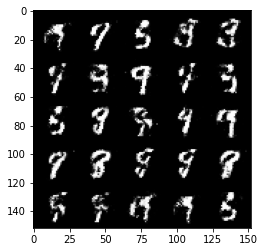

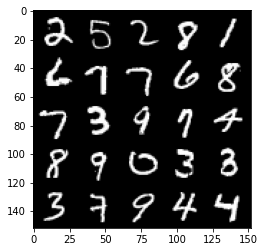

  0%|          | 0/469 [00:00<?, ?it/s]

Step 44500: Generator loss: 2.2415224463939665, discriminator loss: 0.2802890434265137


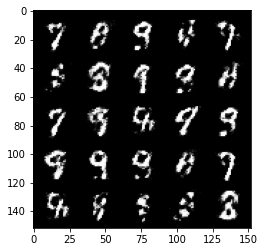

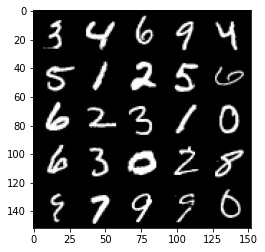

  0%|          | 0/469 [00:00<?, ?it/s]

Step 45000: Generator loss: 2.242118993520736, discriminator loss: 0.2826382789611817


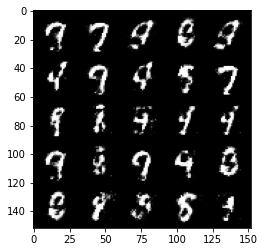

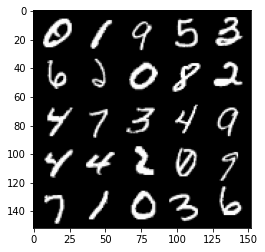

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 45500: Generator loss: 2.3042291886806447, discriminator loss: 0.2697614402770997


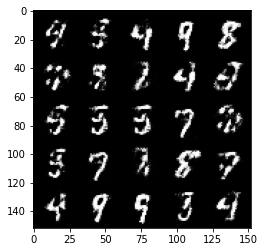

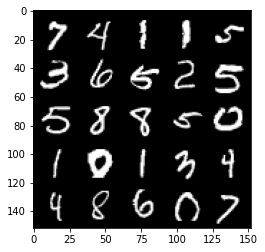

  0%|          | 0/469 [00:00<?, ?it/s]

Step 46000: Generator loss: 2.161385505199429, discriminator loss: 0.2998967085480689


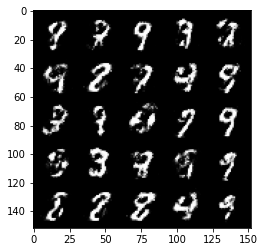

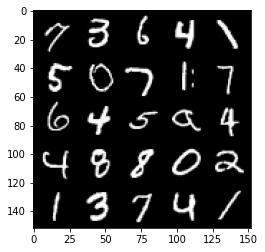

  0%|          | 0/469 [00:00<?, ?it/s]

Step 46500: Generator loss: 2.1677968473434457, discriminator loss: 0.2887828468680382


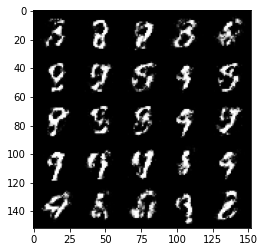

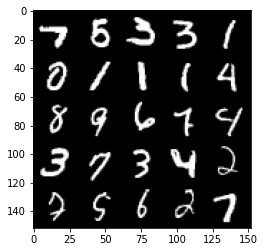

  0%|          | 0/469 [00:00<?, ?it/s]

Step 47000: Generator loss: 2.1634300150871297, discriminator loss: 0.2994173898994924


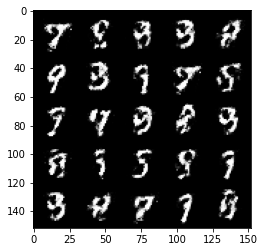

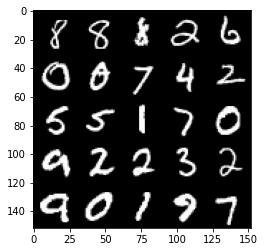

  0%|          | 0/469 [00:00<?, ?it/s]

Step 47500: Generator loss: 2.088232401132586, discriminator loss: 0.3127682180106641


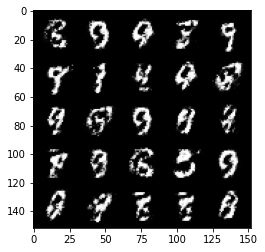

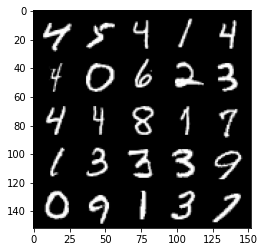

  0%|          | 0/469 [00:00<?, ?it/s]

Step 48000: Generator loss: 2.1632706568241127, discriminator loss: 0.2885303235054017


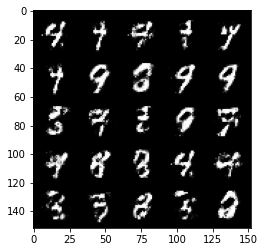

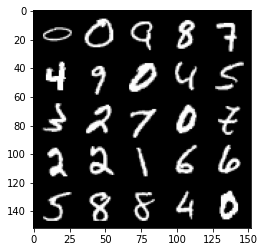

  0%|          | 0/469 [00:00<?, ?it/s]

Step 48500: Generator loss: 2.2185603508949274, discriminator loss: 0.2810245395004747


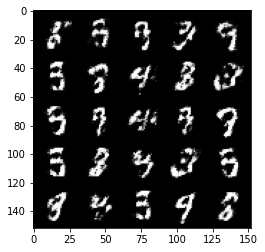

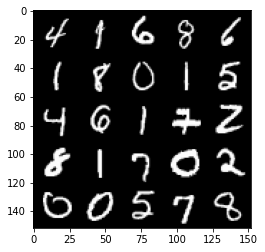

  0%|          | 0/469 [00:00<?, ?it/s]

Step 49000: Generator loss: 2.227504254341126, discriminator loss: 0.2868660258650779


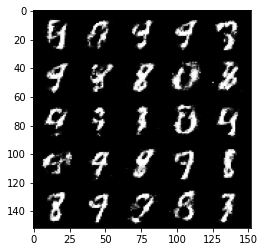

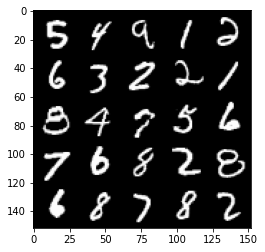

  0%|          | 0/469 [00:00<?, ?it/s]

Step 49500: Generator loss: 2.145197952747344, discriminator loss: 0.3134822408556938


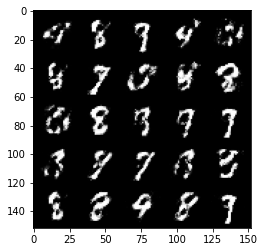

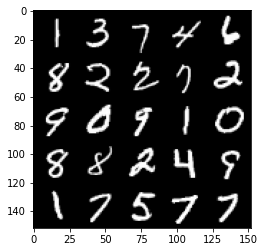

  0%|          | 0/469 [00:00<?, ?it/s]

Step 50000: Generator loss: 1.9431095290184026, discriminator loss: 0.33874258664250395


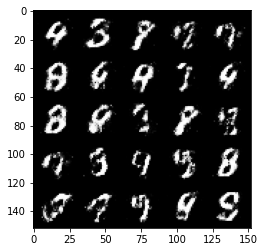

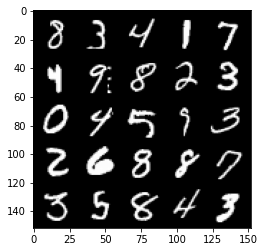

  0%|          | 0/469 [00:00<?, ?it/s]

Step 50500: Generator loss: 1.9596390740871417, discriminator loss: 0.33197119247913376


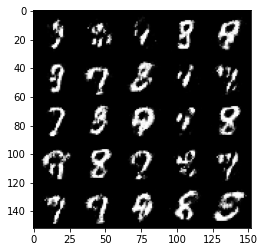

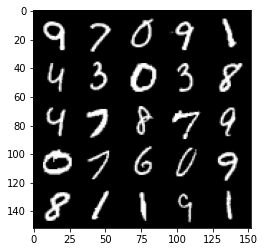

  0%|          | 0/469 [00:00<?, ?it/s]

Step 51000: Generator loss: 1.9875701348781574, discriminator loss: 0.318573931992054


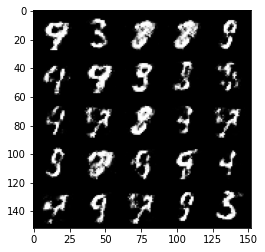

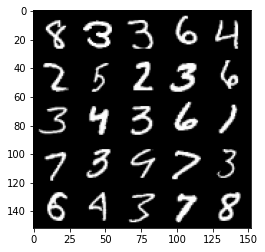

  0%|          | 0/469 [00:00<?, ?it/s]

Step 51500: Generator loss: 1.9144557673931124, discriminator loss: 0.34161971300840377


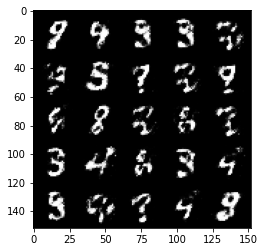

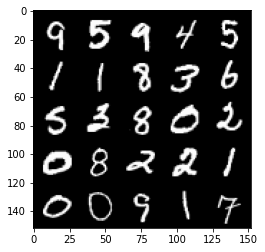

  0%|          | 0/469 [00:00<?, ?it/s]

Step 52000: Generator loss: 1.9747635436058035, discriminator loss: 0.3183256478309631


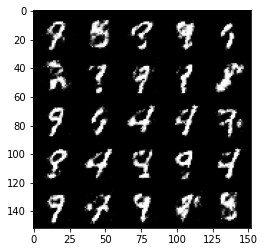

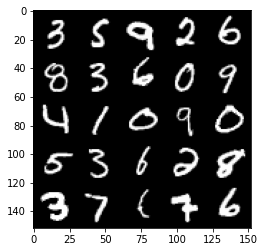

  0%|          | 0/469 [00:00<?, ?it/s]

Step 52500: Generator loss: 1.9512687954902654, discriminator loss: 0.33074518054723706


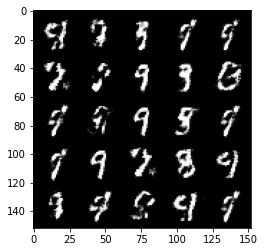

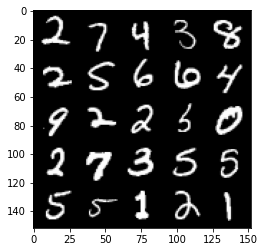

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 53000: Generator loss: 1.9829234759807586, discriminator loss: 0.33552785652875905


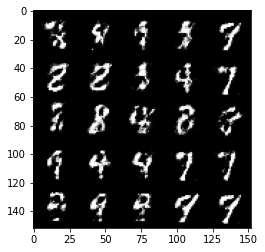

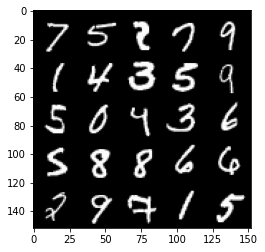

  0%|          | 0/469 [00:00<?, ?it/s]

Step 53500: Generator loss: 1.8947496738433842, discriminator loss: 0.35523464506864544


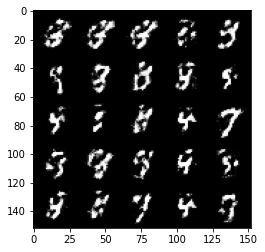

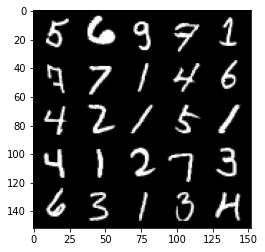

  0%|          | 0/469 [00:00<?, ?it/s]

Step 54000: Generator loss: 2.006176003694536, discriminator loss: 0.32618451449275027


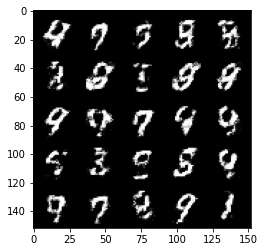

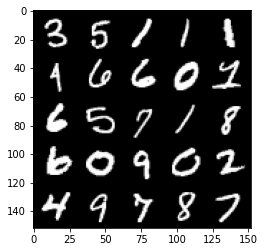

  0%|          | 0/469 [00:00<?, ?it/s]

Step 54500: Generator loss: 1.9616776132583633, discriminator loss: 0.323397456884384


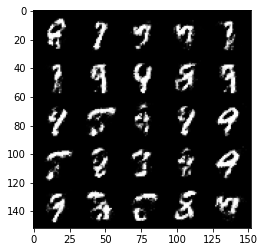

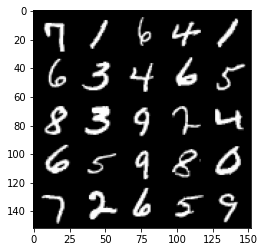

  0%|          | 0/469 [00:00<?, ?it/s]

Step 55000: Generator loss: 1.9479106240272515, discriminator loss: 0.33032792270183553


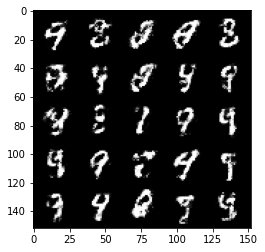

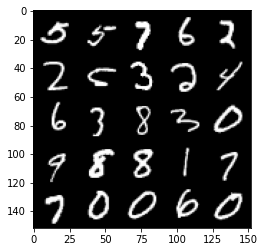

  0%|          | 0/469 [00:00<?, ?it/s]

Step 55500: Generator loss: 2.0541838946342454, discriminator loss: 0.31605684426426917


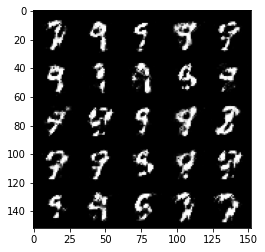

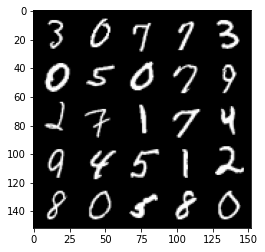

  0%|          | 0/469 [00:00<?, ?it/s]

Step 56000: Generator loss: 1.9187383382320407, discriminator loss: 0.33689427193999266


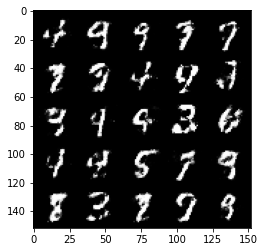

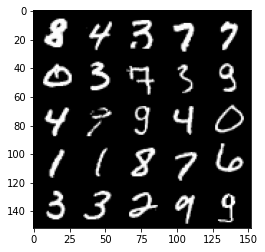

  0%|          | 0/469 [00:00<?, ?it/s]

Step 56500: Generator loss: 1.8444332754612003, discriminator loss: 0.36024394184350966


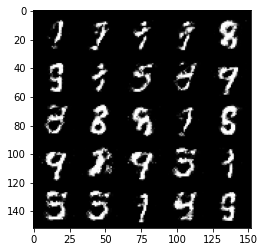

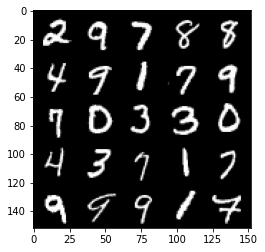

  0%|          | 0/469 [00:00<?, ?it/s]

Step 57000: Generator loss: 1.8190786979198457, discriminator loss: 0.3491125099360945


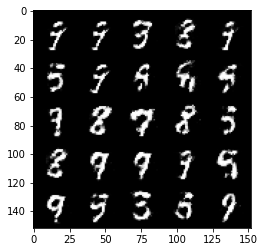

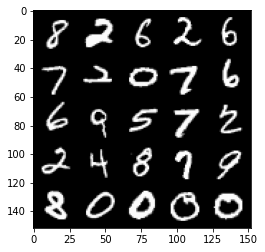

  0%|          | 0/469 [00:00<?, ?it/s]

Step 57500: Generator loss: 1.9076910452842704, discriminator loss: 0.3396737053096295


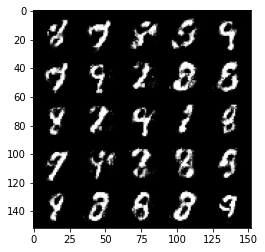

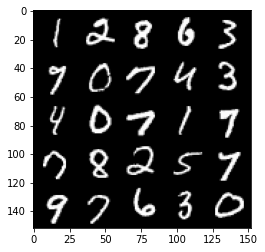

  0%|          | 0/469 [00:00<?, ?it/s]

Step 58000: Generator loss: 1.9021708166599267, discriminator loss: 0.3311116287708284


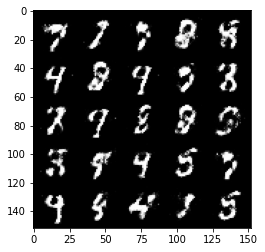

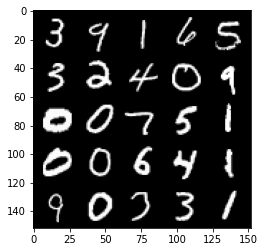

  0%|          | 0/469 [00:00<?, ?it/s]

Step 58500: Generator loss: 1.8488658187389366, discriminator loss: 0.3518950177133081


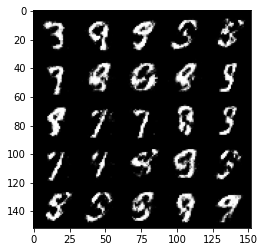

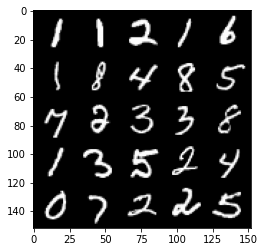

  0%|          | 0/469 [00:00<?, ?it/s]

Step 59000: Generator loss: 1.7421140131950381, discriminator loss: 0.3749545302391051


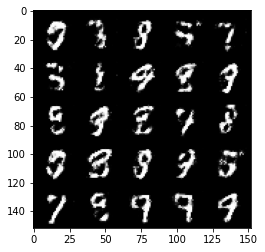

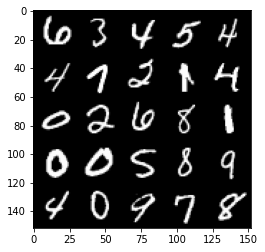

  0%|          | 0/469 [00:00<?, ?it/s]

Step 59500: Generator loss: 1.801638769149781, discriminator loss: 0.3595385969281199


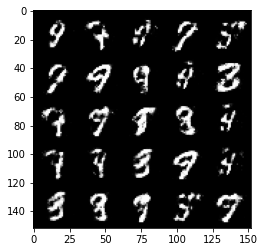

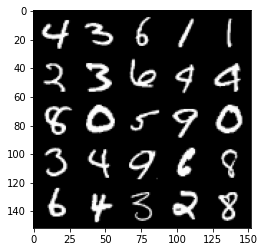

  0%|          | 0/469 [00:00<?, ?it/s]

Step 60000: Generator loss: 1.7431726961135865, discriminator loss: 0.3692397089004513


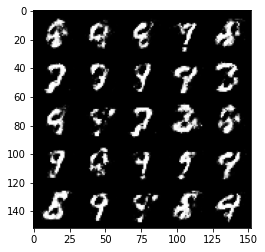

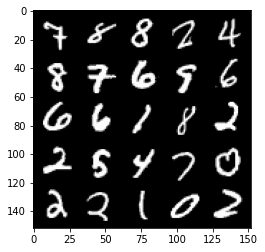

  0%|          | 0/469 [00:00<?, ?it/s]

Step 60500: Generator loss: 1.7447871005535123, discriminator loss: 0.359426358640194


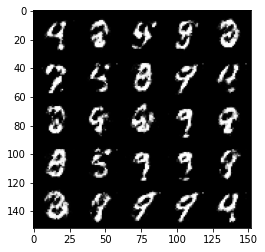

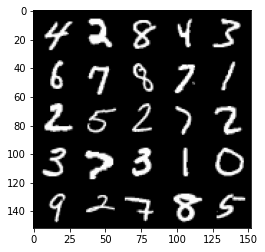

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 61000: Generator loss: 1.7820454020500187, discriminator loss: 0.3604583288431166


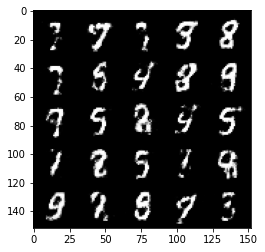

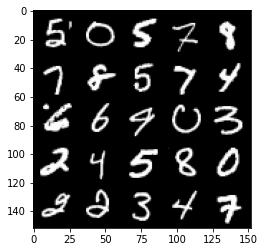

  0%|          | 0/469 [00:00<?, ?it/s]

Step 61500: Generator loss: 1.6847933032512663, discriminator loss: 0.39519017469882967


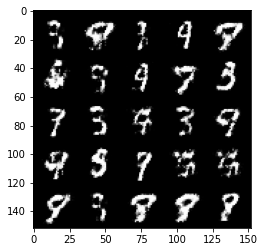

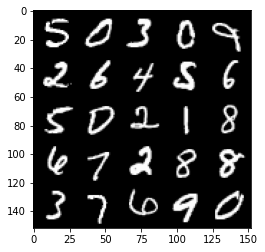

  0%|          | 0/469 [00:00<?, ?it/s]

Step 62000: Generator loss: 1.7611179187297814, discriminator loss: 0.36199793073534997


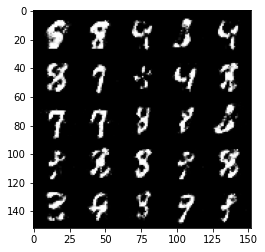

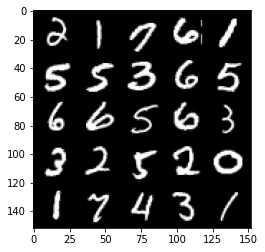

  0%|          | 0/469 [00:00<?, ?it/s]

Step 62500: Generator loss: 1.7427889454364776, discriminator loss: 0.37344777315855016


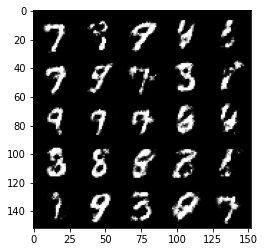

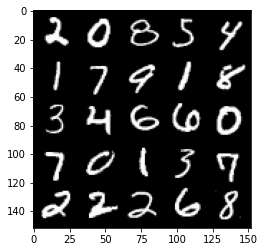

  0%|          | 0/469 [00:00<?, ?it/s]

Step 63000: Generator loss: 1.6474546029567718, discriminator loss: 0.3893949128389354


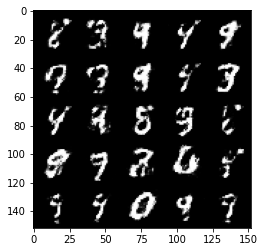

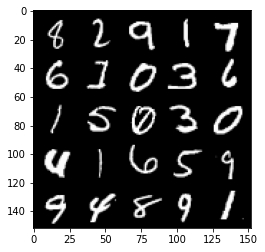

  0%|          | 0/469 [00:00<?, ?it/s]

Step 63500: Generator loss: 1.680493147850037, discriminator loss: 0.377169595420361


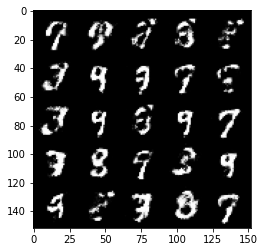

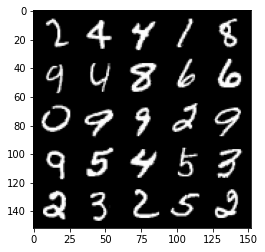

  0%|          | 0/469 [00:00<?, ?it/s]

Step 64000: Generator loss: 1.5942941176891334, discriminator loss: 0.4107960745692253


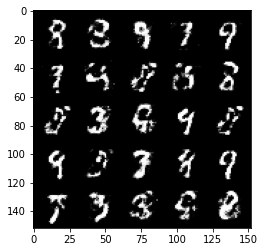

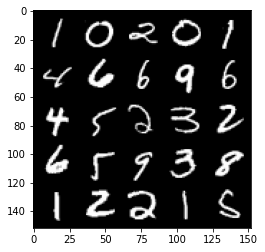

  0%|          | 0/469 [00:00<?, ?it/s]

Step 64500: Generator loss: 1.701023283720017, discriminator loss: 0.3799708071351047


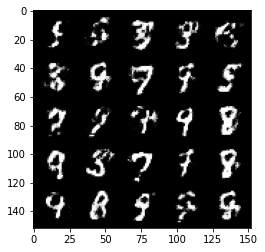

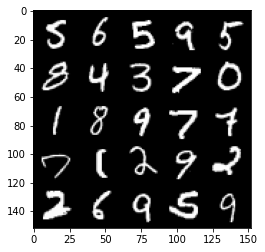

  0%|          | 0/469 [00:00<?, ?it/s]

Step 65000: Generator loss: 1.6506284427642826, discriminator loss: 0.39825247895717636


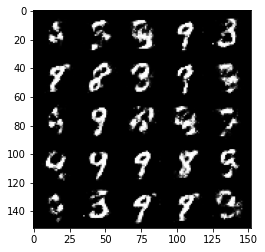

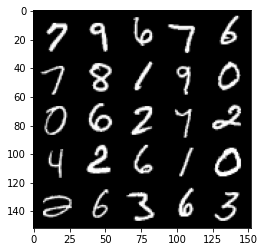

  0%|          | 0/469 [00:00<?, ?it/s]

Step 65500: Generator loss: 1.6782117052078236, discriminator loss: 0.39561598032712936


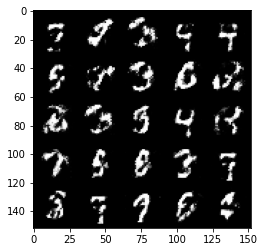

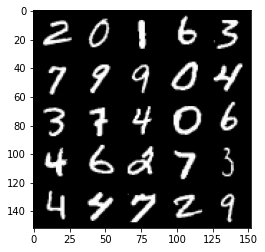

  0%|          | 0/469 [00:00<?, ?it/s]

Step 66000: Generator loss: 1.7519475724697116, discriminator loss: 0.36703192448616045


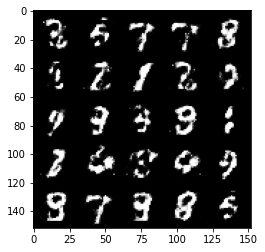

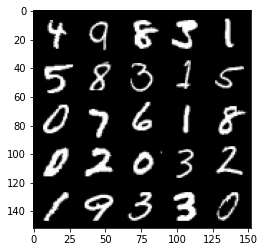

  0%|          | 0/469 [00:00<?, ?it/s]

Step 66500: Generator loss: 1.7436318633556351, discriminator loss: 0.35890545010566716


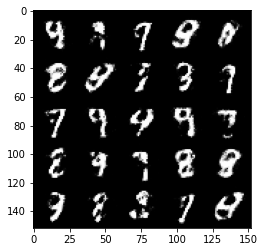

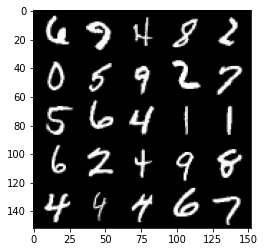

  0%|          | 0/469 [00:00<?, ?it/s]

Step 67000: Generator loss: 1.6104328651428221, discriminator loss: 0.40022388660907726


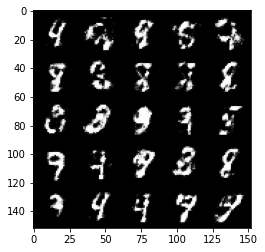

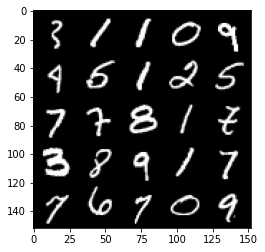

  0%|          | 0/469 [00:00<?, ?it/s]

Step 67500: Generator loss: 1.6066280088424674, discriminator loss: 0.39110883980989464


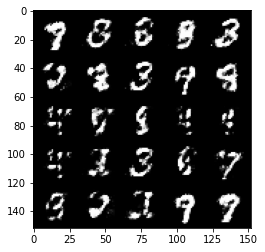

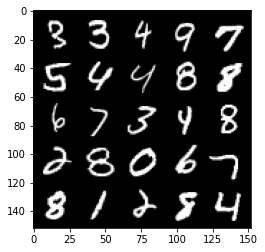

  0%|          | 0/469 [00:00<?, ?it/s]

Step 68000: Generator loss: 1.5710299084186568, discriminator loss: 0.40416558706760414


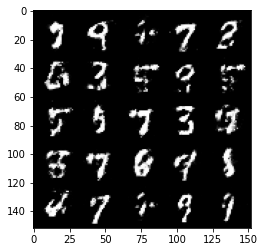

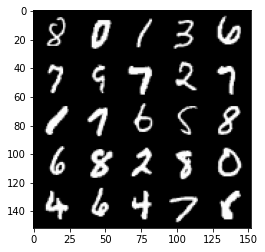

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 68500: Generator loss: 1.6066187353134147, discriminator loss: 0.39727148288488373


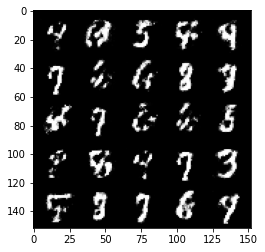

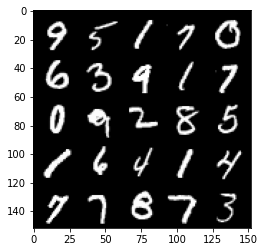

  0%|          | 0/469 [00:00<?, ?it/s]

Step 69000: Generator loss: 1.6115906634330754, discriminator loss: 0.38866454756259894


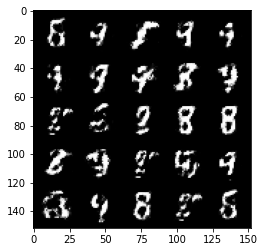

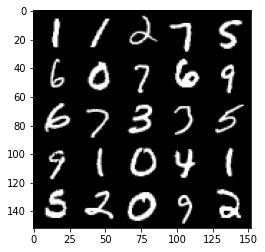

  0%|          | 0/469 [00:00<?, ?it/s]

Step 69500: Generator loss: 1.6411805887222286, discriminator loss: 0.37994239354133585


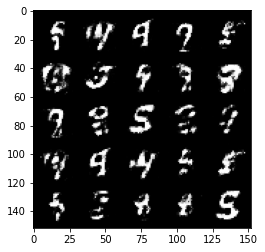

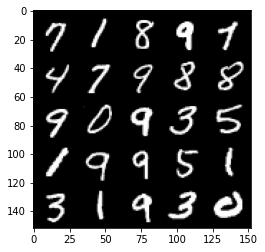

  0%|          | 0/469 [00:00<?, ?it/s]

Step 70000: Generator loss: 1.6777366940975214, discriminator loss: 0.38703314483165735


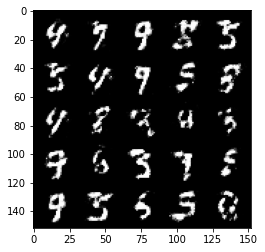

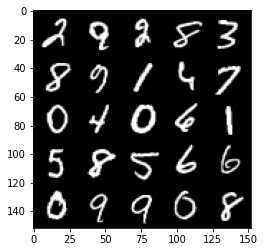

  0%|          | 0/469 [00:00<?, ?it/s]

Step 70500: Generator loss: 1.7299978964328757, discriminator loss: 0.3578504180908205


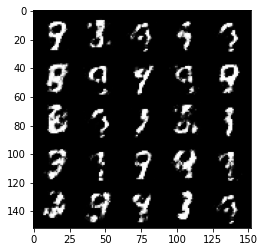

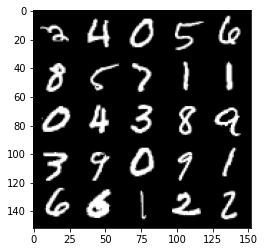

  0%|          | 0/469 [00:00<?, ?it/s]

Step 71000: Generator loss: 1.7054963886737826, discriminator loss: 0.384021091401577


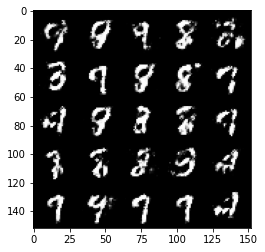

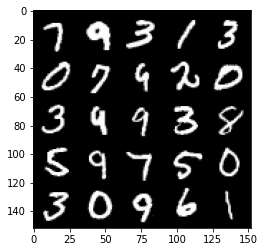

  0%|          | 0/469 [00:00<?, ?it/s]

Step 71500: Generator loss: 1.6010161559581761, discriminator loss: 0.4052795639634131


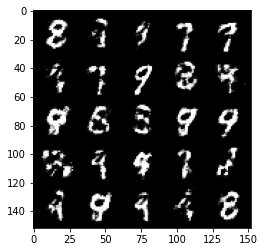

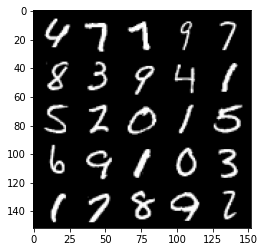

  0%|          | 0/469 [00:00<?, ?it/s]

Step 72000: Generator loss: 1.5232103147506713, discriminator loss: 0.42172448748350133


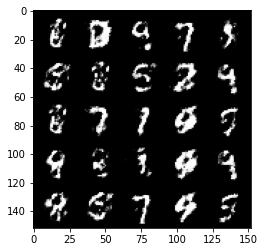

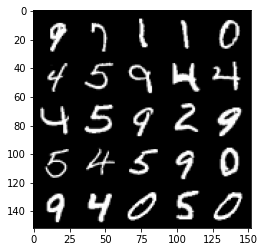

  0%|          | 0/469 [00:00<?, ?it/s]

Step 72500: Generator loss: 1.6487950975894912, discriminator loss: 0.3853666489720347


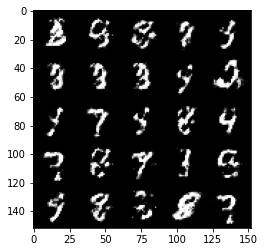

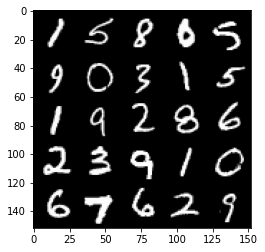

  0%|          | 0/469 [00:00<?, ?it/s]

Step 73000: Generator loss: 1.6946276452541333, discriminator loss: 0.37731799048185327


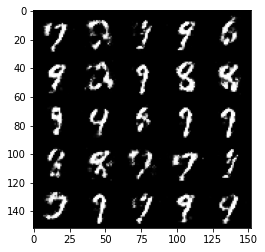

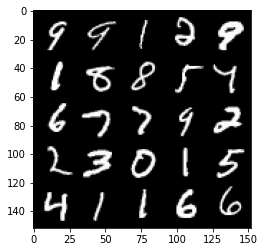

  0%|          | 0/469 [00:00<?, ?it/s]

Step 73500: Generator loss: 1.6457492666244495, discriminator loss: 0.3764564942717549


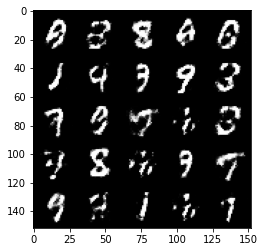

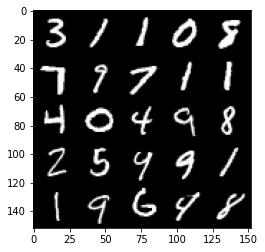

  0%|          | 0/469 [00:00<?, ?it/s]

Step 74000: Generator loss: 1.6521604700088497, discriminator loss: 0.3842823070883752


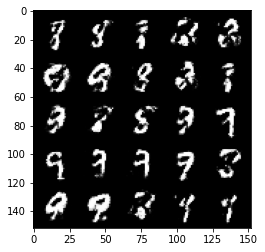

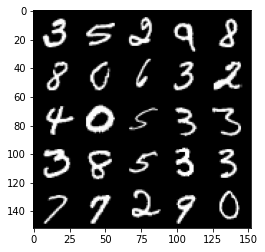

  0%|          | 0/469 [00:00<?, ?it/s]

Step 74500: Generator loss: 1.5443558106422413, discriminator loss: 0.4029513460397722


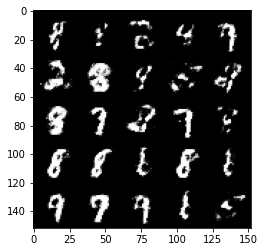

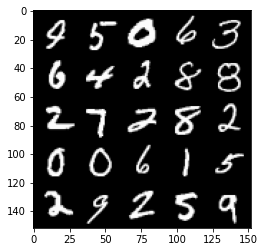

  0%|          | 0/469 [00:00<?, ?it/s]

Step 75000: Generator loss: 1.5759294190406787, discriminator loss: 0.39131626027822497


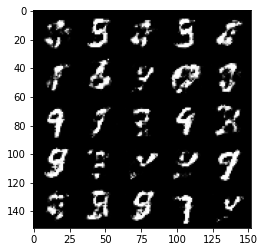

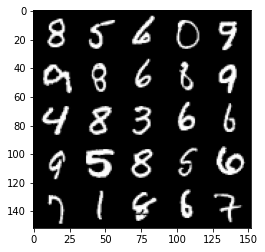

  0%|          | 0/469 [00:00<?, ?it/s]

Step 75500: Generator loss: 1.603199506998063, discriminator loss: 0.40040543073415724


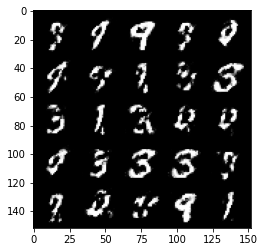

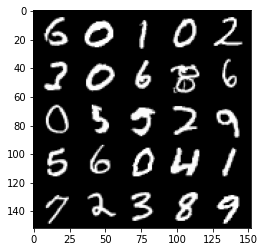

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 76000: Generator loss: 1.4950943078994763, discriminator loss: 0.4275699016451835


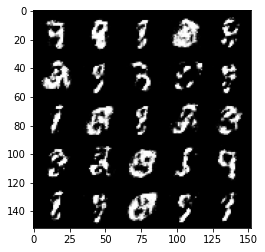

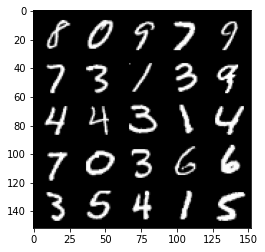

  0%|          | 0/469 [00:00<?, ?it/s]

Step 76500: Generator loss: 1.5222167260646824, discriminator loss: 0.41642770820856073


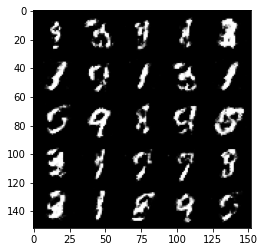

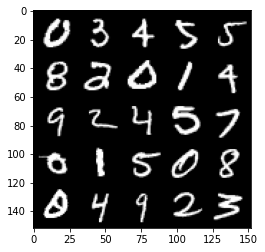

  0%|          | 0/469 [00:00<?, ?it/s]

Step 77000: Generator loss: 1.5413540854454042, discriminator loss: 0.4060224839448926


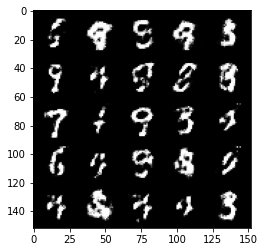

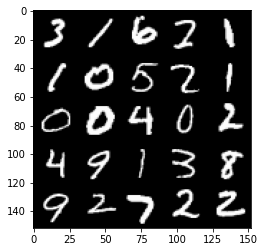

  0%|          | 0/469 [00:00<?, ?it/s]

Step 77500: Generator loss: 1.4855540914535528, discriminator loss: 0.4191900763511661


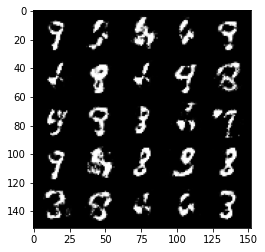

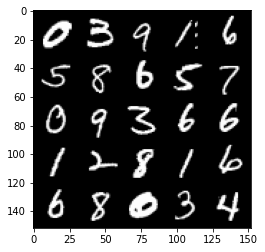

  0%|          | 0/469 [00:00<?, ?it/s]

Step 78000: Generator loss: 1.6788733830451967, discriminator loss: 0.3687880111932756


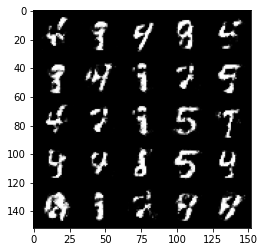

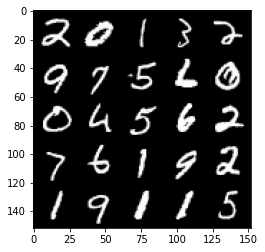

  0%|          | 0/469 [00:00<?, ?it/s]

Step 78500: Generator loss: 1.5563200526237497, discriminator loss: 0.42054499793052685


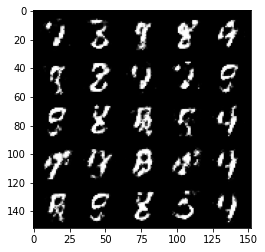

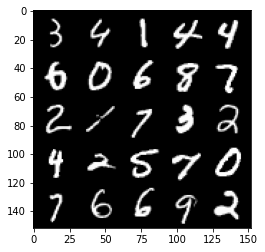

  0%|          | 0/469 [00:00<?, ?it/s]

Step 79000: Generator loss: 1.5858235175609587, discriminator loss: 0.40273461085557954


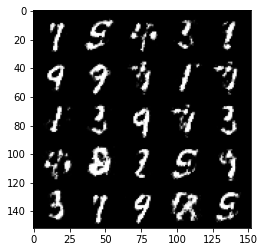

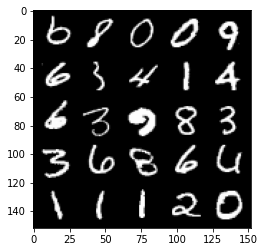

  0%|          | 0/469 [00:00<?, ?it/s]

Step 79500: Generator loss: 1.5560686898231517, discriminator loss: 0.4208871150016787


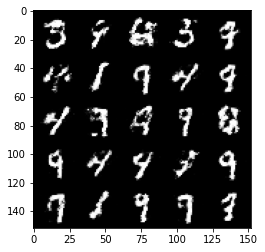

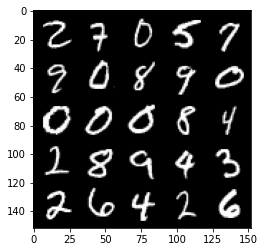

  0%|          | 0/469 [00:00<?, ?it/s]

Step 80000: Generator loss: 1.4843608236312864, discriminator loss: 0.4301630166172986


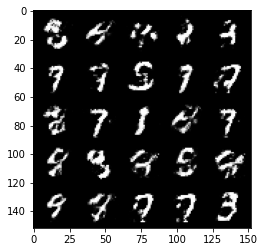

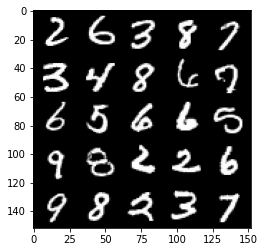

  0%|          | 0/469 [00:00<?, ?it/s]

Step 80500: Generator loss: 1.5573811707496632, discriminator loss: 0.40318316584825514


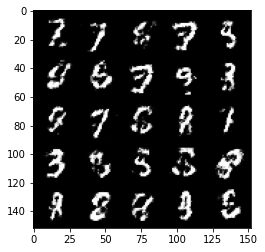

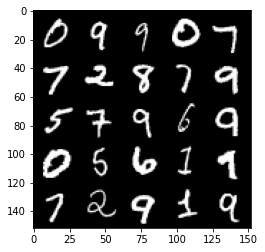

  0%|          | 0/469 [00:00<?, ?it/s]

Step 81000: Generator loss: 1.437492791414263, discriminator loss: 0.4543366758227346


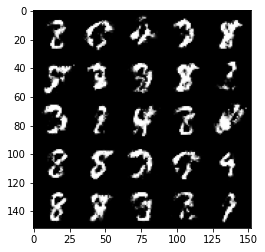

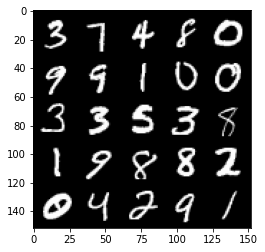

  0%|          | 0/469 [00:00<?, ?it/s]

Step 81500: Generator loss: 1.5045370774269098, discriminator loss: 0.426463229715824


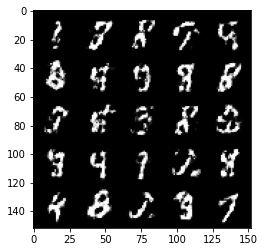

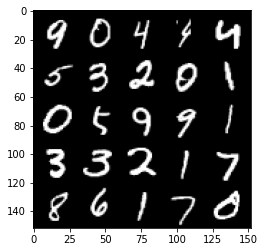

  0%|          | 0/469 [00:00<?, ?it/s]

Step 82000: Generator loss: 1.4929779231548304, discriminator loss: 0.4217497064471246


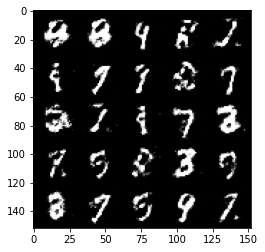

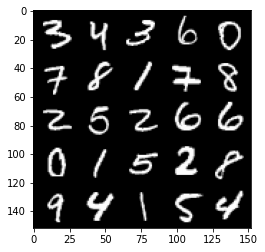

  0%|          | 0/469 [00:00<?, ?it/s]

Step 82500: Generator loss: 1.442008985519411, discriminator loss: 0.43004916048049924


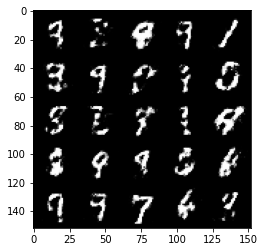

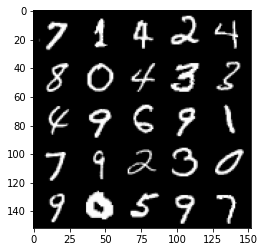

  0%|          | 0/469 [00:00<?, ?it/s]

Step 83000: Generator loss: 1.4057627775669106, discriminator loss: 0.440881763279438


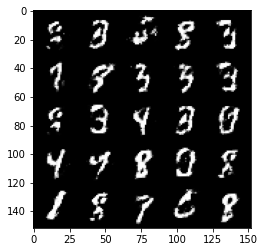

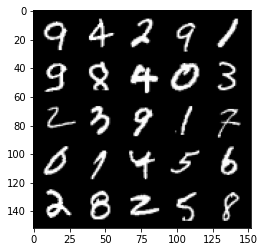

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 83500: Generator loss: 1.4209723384380344, discriminator loss: 0.44948384922742823


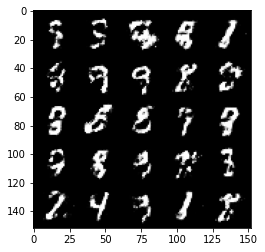

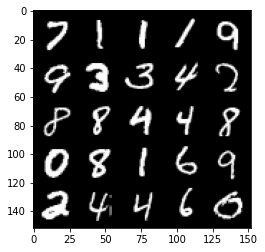

  0%|          | 0/469 [00:00<?, ?it/s]

Step 84000: Generator loss: 1.4271321253776537, discriminator loss: 0.44485214263200823


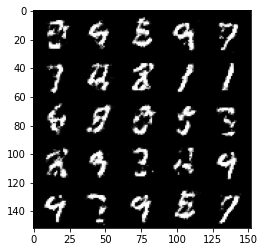

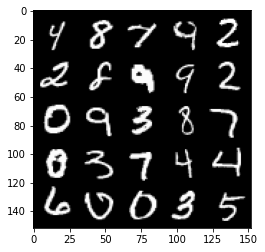

  0%|          | 0/469 [00:00<?, ?it/s]

Step 84500: Generator loss: 1.3632582395076738, discriminator loss: 0.4656829197406764


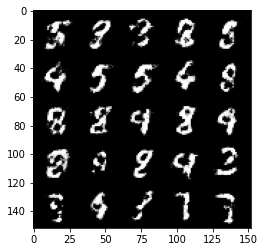

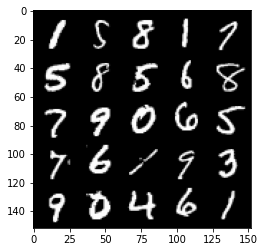

  0%|          | 0/469 [00:00<?, ?it/s]

Step 85000: Generator loss: 1.4153757138252256, discriminator loss: 0.44501581621170044


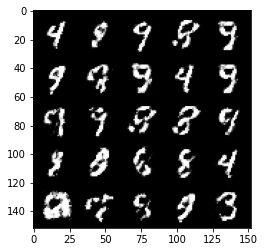

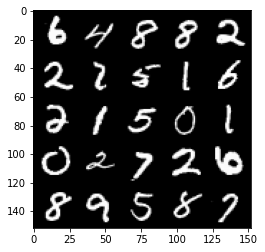

  0%|          | 0/469 [00:00<?, ?it/s]

Step 85500: Generator loss: 1.423793499946595, discriminator loss: 0.439686602652073


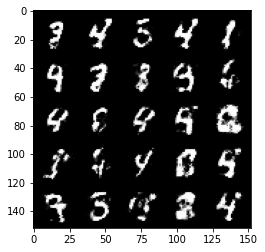

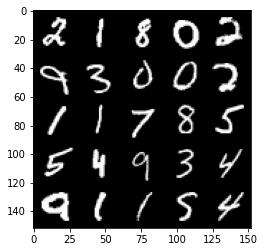

  0%|          | 0/469 [00:00<?, ?it/s]

Step 86000: Generator loss: 1.4232095072269428, discriminator loss: 0.43330179923772816


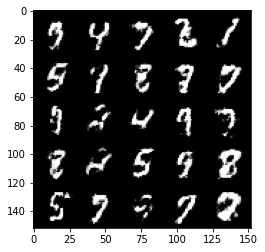

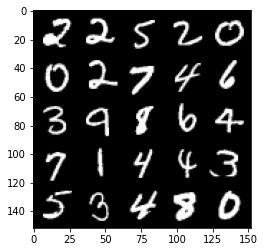

  0%|          | 0/469 [00:00<?, ?it/s]

Step 86500: Generator loss: 1.3800889644622805, discriminator loss: 0.4553987459540371


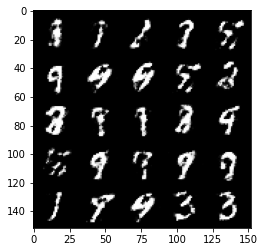

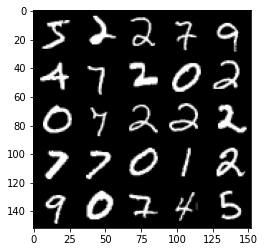

  0%|          | 0/469 [00:00<?, ?it/s]

Step 87000: Generator loss: 1.3418118059635153, discriminator loss: 0.4732358081340792


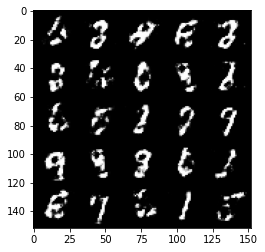

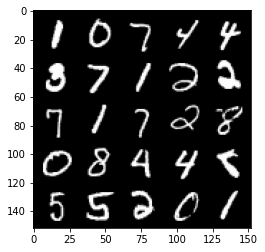

  0%|          | 0/469 [00:00<?, ?it/s]

Step 87500: Generator loss: 1.3320222985744474, discriminator loss: 0.4700304492115976


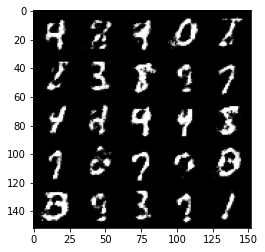

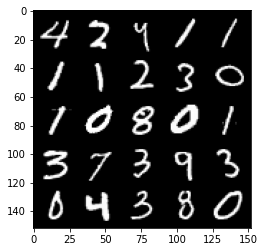

  0%|          | 0/469 [00:00<?, ?it/s]

Step 88000: Generator loss: 1.3584089634418481, discriminator loss: 0.459815576672554


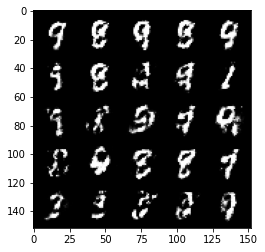

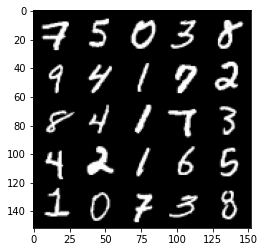

  0%|          | 0/469 [00:00<?, ?it/s]

Step 88500: Generator loss: 1.336288061141968, discriminator loss: 0.46964108473062516


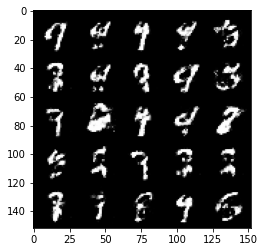

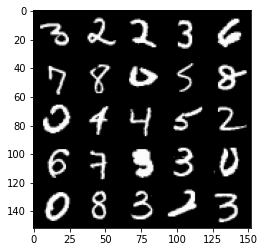

  0%|          | 0/469 [00:00<?, ?it/s]

Step 89000: Generator loss: 1.3703174614906306, discriminator loss: 0.4522969946861265


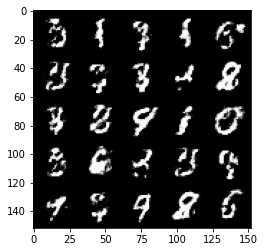

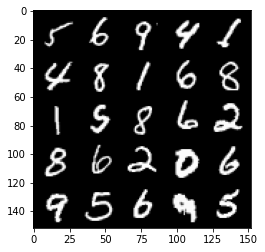

  0%|          | 0/469 [00:00<?, ?it/s]

Step 89500: Generator loss: 1.3648469851016993, discriminator loss: 0.4541436363458633


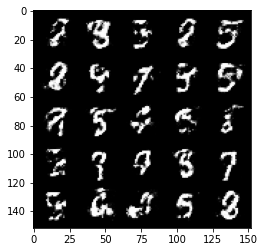

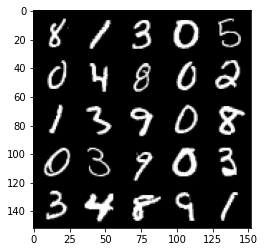

  0%|          | 0/469 [00:00<?, ?it/s]

Step 90000: Generator loss: 1.3634214189052574, discriminator loss: 0.4622537743449209


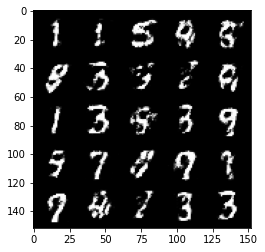

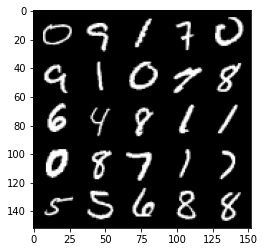

  0%|          | 0/469 [00:00<?, ?it/s]

Step 90500: Generator loss: 1.3707144632339492, discriminator loss: 0.45723159837722743


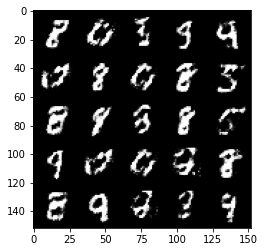

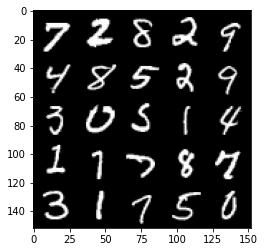

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 91000: Generator loss: 1.3231810140609748, discriminator loss: 0.47806322425603887


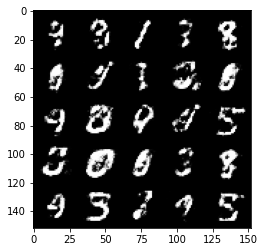

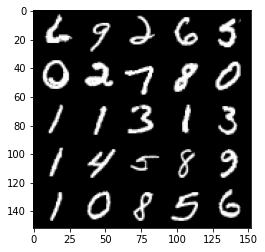

  0%|          | 0/469 [00:00<?, ?it/s]

Step 91500: Generator loss: 1.273448858737945, discriminator loss: 0.4814610406160357


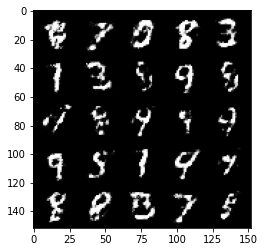

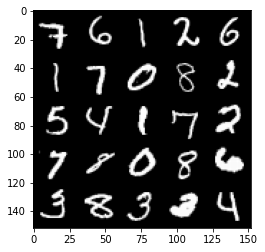

  0%|          | 0/469 [00:00<?, ?it/s]

Step 92000: Generator loss: 1.3387167630195622, discriminator loss: 0.460958909273148


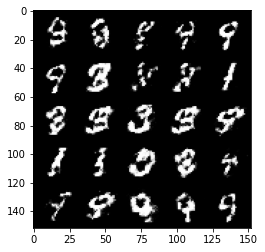

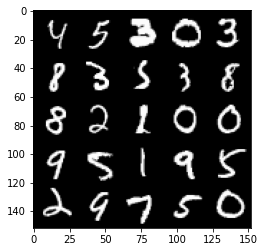

  0%|          | 0/469 [00:00<?, ?it/s]

Step 92500: Generator loss: 1.3021075558662425, discriminator loss: 0.4822146304249763


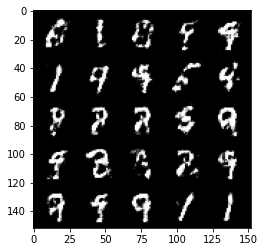

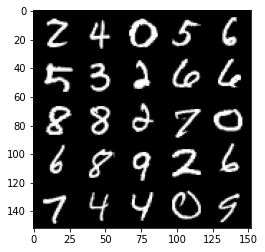

  0%|          | 0/469 [00:00<?, ?it/s]

Step 93000: Generator loss: 1.2946102764606469, discriminator loss: 0.48093424701690685


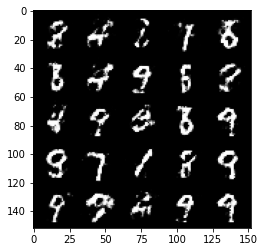

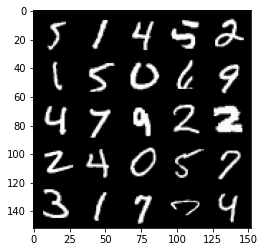

  0%|          | 0/469 [00:00<?, ?it/s]

Step 93500: Generator loss: 1.2513028724193578, discriminator loss: 0.49692197662591936


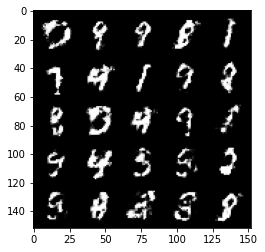

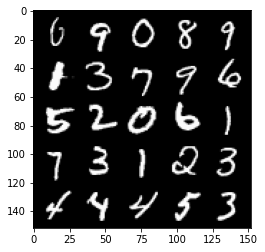

In [ ]:
cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
test_generator = True # Whether the generator should be tested
gen_loss = False
error = False
for epoch in range(n_epochs):
  
    # Dataloader returns the batches
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)

        # Flatten the batch of real images from the dataset
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradients before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Update optimizer
        disc_opt.step()

        # For testing purposes, to keep track of the generator weights
        if test_generator:
            old_generator_weights = gen.gen[0][0].weight.detach().clone()

        ### Update generator ###
        
        gen_opt.zero_grad()

        gen_loss = get_gen_loss(gen, disc, criterion, cur_batch_size, z_dim, device)
        
        gen_loss.backward(retain_graph=True)
        
        gen_opt.step()
        
        # Keep track of the average discriminator loss
        mean_discriminator_loss += disc_loss.item() / display_step

        # Keep track of the average generator loss
        mean_generator_loss += gen_loss.item() / display_step

        ### Visualization code ###
        if cur_step % display_step == 0 and cur_step > 0:
            print(f"Step {cur_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            show_tensor_images(fake)
            show_tensor_images(real)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
        cur_step += 1
